<a href="https://colab.research.google.com/github/manal-0603/Weather-Forecasting-using-Machine-Learning-algorithms/blob/main/Comparaison_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [322]:
# Importation des bibliothèques nécessaires
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, AdaBoostRegressor, GradientBoostingRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib

In [323]:
import pandas as pd

# Charger les dataset
donnnes_meteo = pd.read_csv('donnees_meteo.csv')

In [324]:
# Assurez-vous que l'index est de type 'Timestamp'
donnnes_meteo.index = pd.to_datetime(donnnes_meteo["datetime"])

donnnes_meteo['year'] = pd.to_datetime(donnnes_meteo["datetime"]).dt.year

# Diviser les données en fonction de la date
train_data = donnnes_meteo[donnnes_meteo.index.year < 2020]  # Données d'entraînement jusqu'à 2019
val_data = donnnes_meteo[donnnes_meteo.index.year == 2020]   # Données de validation en 2020
test_data = donnnes_meteo[donnnes_meteo.index.year >= 2021]  # Données de test à partir de 2021

In [325]:
selected_columns_train =[ 'dew', 'humidity', 'precip',
       'precipprob', 'windgust', 'windspeed', 'winddir',
       'sealevelpressure', 'cloudcover', 'visibility', 'solarradiation',
       'solarenergy', 'uvindex', 'conditions_Clear',
       'conditions_Overcast', 'conditions_Partially cloudy', 'conditions_Rain',
       'conditions_Rain, Fog', 'conditions_Rain, Overcast',
       'conditions_Rain, Partially cloudy']

X_train, y_train = train_data[selected_columns_train], train_data['temp']
X_test, y_test = test_data[selected_columns_train], test_data['temp']
X_val, y_val = val_data[selected_columns_train], val_data['temp']

In [326]:
# Charger les modèles à partir des fichiers
dt_model = joblib.load('best_dt_regressor_model.joblib')
et_model = joblib.load('best_et_regressor_model.joblib')
rf_model = joblib.load('best_rf_regressor_model.joblib')
ada_model = joblib.load('best_ada_regressor_model.joblib')
gb_model = joblib.load('best_gb_regressor_model.joblib')
xgb_model = joblib.load('best_xgb_regressor_model.joblib')
lgbm_model = joblib.load('best_lgbm_regressor_model.joblib')

# **Comparaison des models sur l'ensemble d'entrainement**

In [327]:
# Faire des prédictions avec chaque modèle
dt_predictions_train = dt_model.predict(X_train)
et_predictions_train = et_model.predict(X_train)
rf_predictions_train = rf_model.predict(X_train)
ada_predictions_train = ada_model.predict(X_train)
gb_predictions_train = gb_model.predict(X_train)
xgb_predictions_train = xgb_model.predict(X_train)
lgbm_predictions_train = lgbm_model.predict(X_train)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


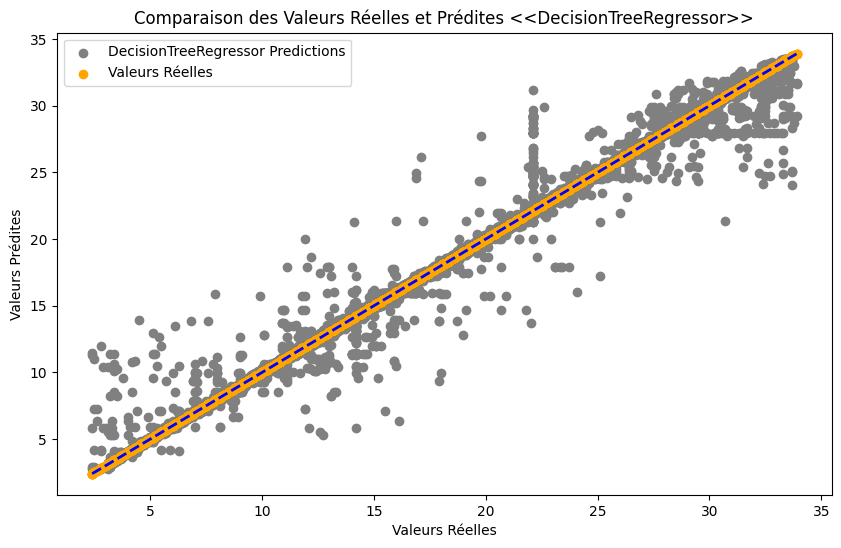

In [328]:
# Création du graphique
plt.figure(figsize=(10, 6))


# Tracé des valeurs prédites pour DecisionTreeRegressor
plt.scatter(y_train, dt_predictions_train, color='grey', label='DecisionTreeRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_train, y_train, color='orange', label='Valeurs Réelles')

plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], linestyle='--', color='blue', linewidth=2)

# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<DecisionTreeRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

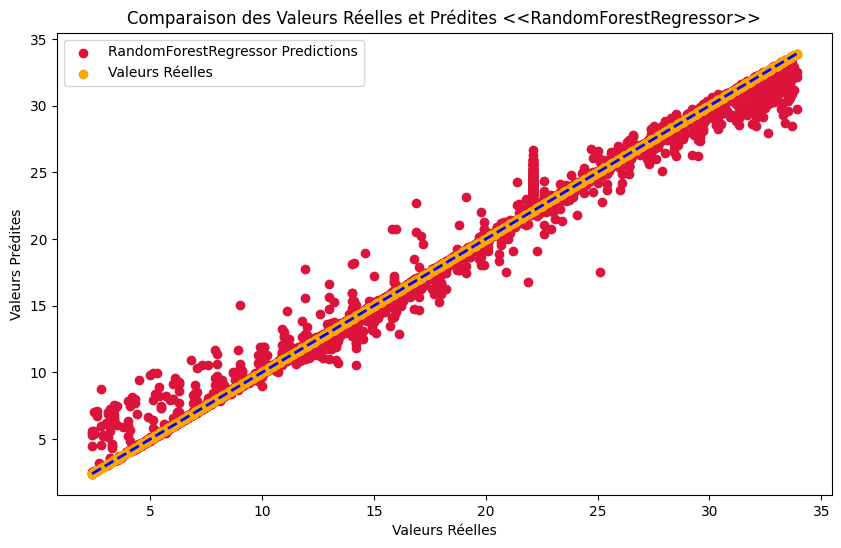

In [329]:
# Création du graphique
plt.figure(figsize=(10, 6))

# Tracé des valeurs prédites pour RandomForestRegressor
plt.scatter(y_train, rf_predictions_train, color='crimson', label='RandomForestRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_train, y_train, color='orange', label='Valeurs Réelles')

plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], linestyle='--', color='blue', linewidth=2)


# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<RandomForestRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

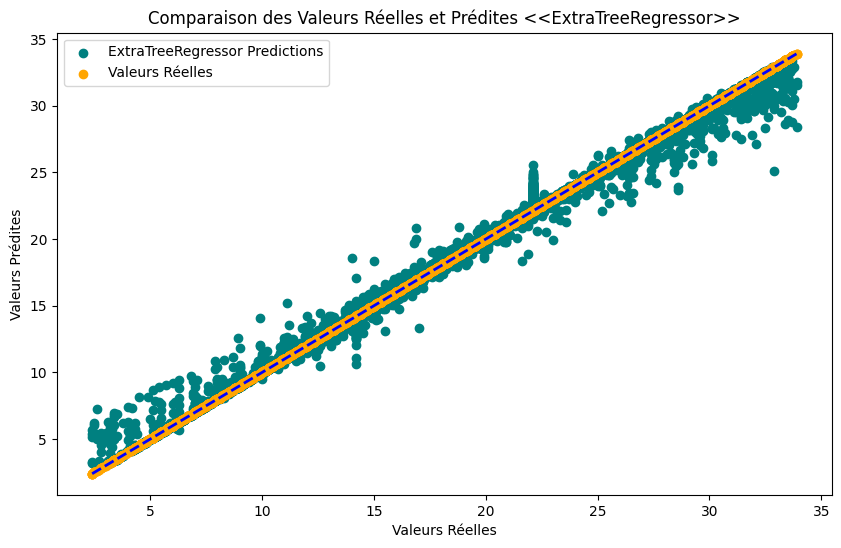

In [330]:
# Création du graphique
plt.figure(figsize=(10, 6))


# Tracé des valeurs prédites pour ExtraTreeRegressor
plt.scatter(y_train, et_predictions_train, color='teal', label='ExtraTreeRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_train, y_train, color='orange', label='Valeurs Réelles')

plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], linestyle='--', color='blue', linewidth=2)

# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<ExtraTreeRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

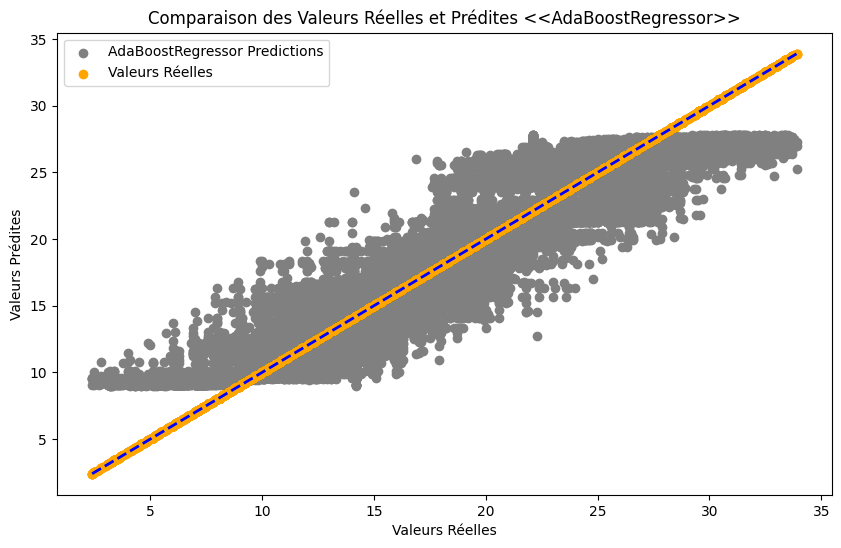

In [331]:
# Création du graphique
plt.figure(figsize=(10, 6))


# Tracé des valeurs prédites pour AdaBoostRegressor
plt.scatter(y_train, ada_predictions_train, color='grey', label='AdaBoostRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_train, y_train, color='orange', label='Valeurs Réelles')

plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], linestyle='--', color='blue', linewidth=2)

# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<AdaBoostRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

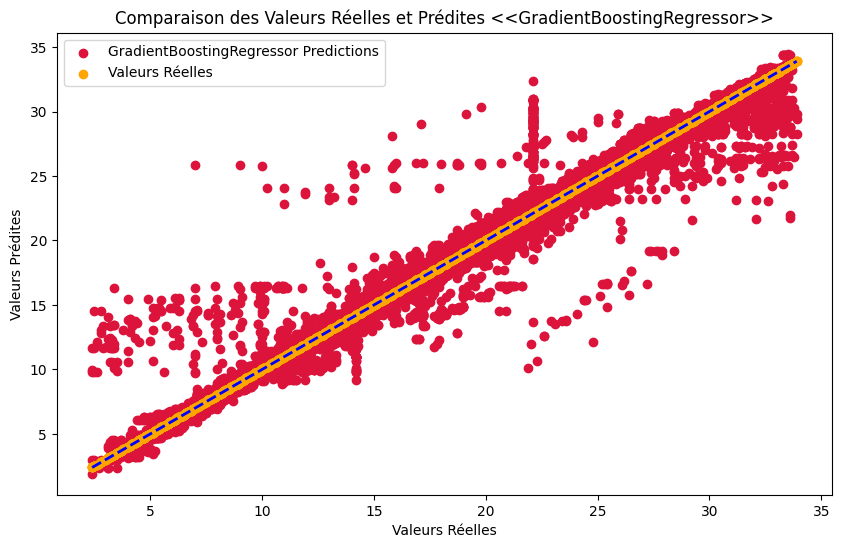

In [332]:
# Création du graphique
plt.figure(figsize=(10, 6))

# Tracé des valeurs prédites pour GradientBoostingRegressor
plt.scatter(y_train, gb_predictions_train, color='crimson', label='GradientBoostingRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_train, y_train, color='orange', label='Valeurs Réelles')

plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], linestyle='--', color='blue', linewidth=2)


# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<GradientBoostingRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

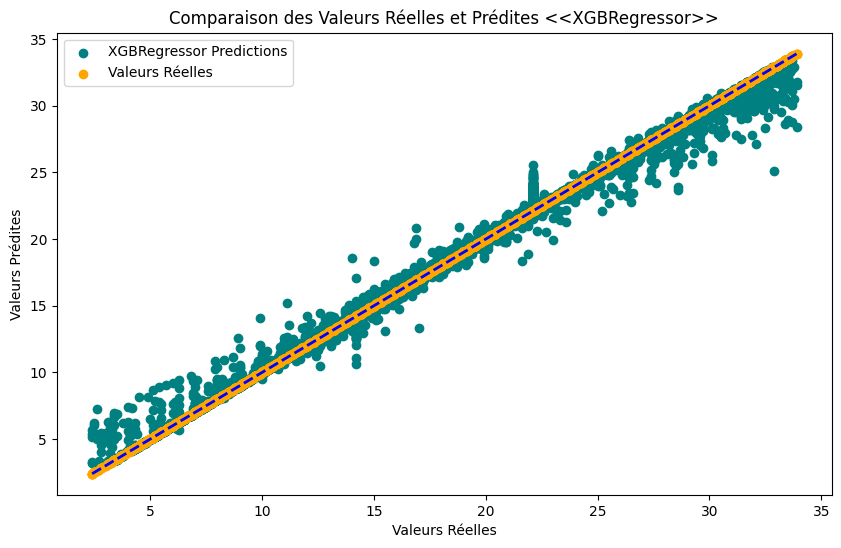

In [333]:
# Création du graphique
plt.figure(figsize=(10, 6))


# Tracé des valeurs prédites pour XGBRegressor
plt.scatter(y_train, et_predictions_train, color='teal', label='XGBRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_train, y_train, color='orange', label='Valeurs Réelles')

plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], linestyle='--', color='blue', linewidth=2)

# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<XGBRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

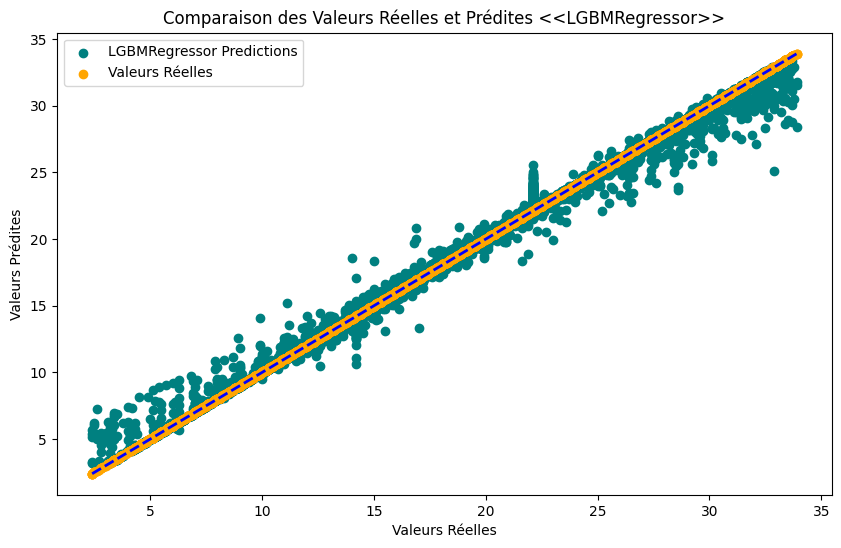

In [334]:
# Création du graphique
plt.figure(figsize=(10, 6))


# Tracé des valeurs prédites pour LGBMRegressor
plt.scatter(y_train, et_predictions_train, color='teal', label='LGBMRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_train, y_train, color='orange', label='Valeurs Réelles')

plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], linestyle='--', color='blue', linewidth=2)

# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<LGBMRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

## **Analyse des prédictions de température par modèle de régression sur les données d'entrainement**

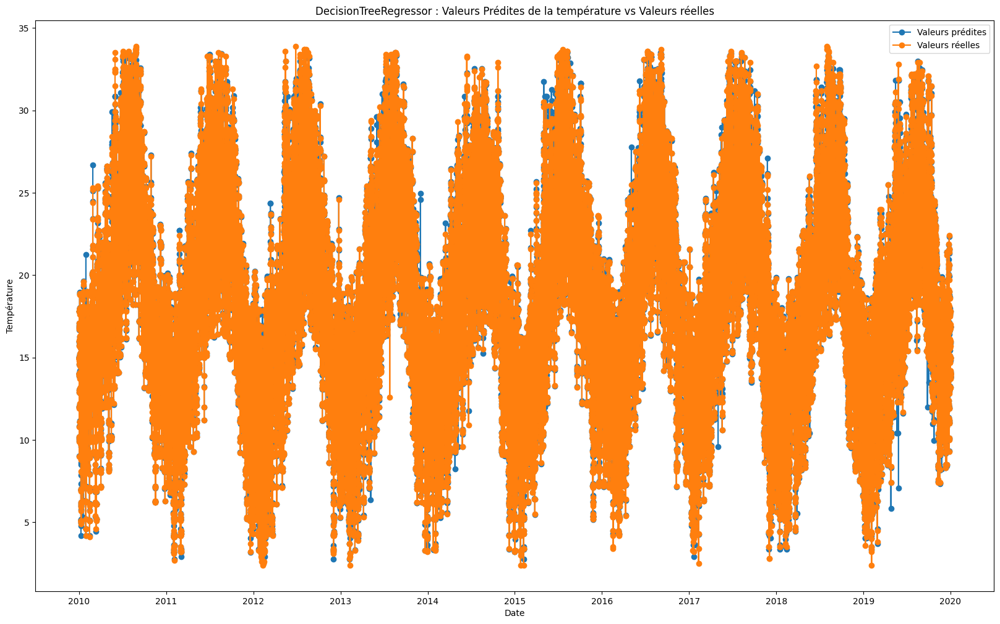

In [335]:
# Créer un graphe
plt.figure(figsize=(20, 12))

# Tracer les données d'entrainement
plt.plot(train_data.index, dt_predictions_train, label='Valeurs prédites', marker='o')


# Tracer les données d'entrainement
plt.plot(train_data.index, y_train, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('DecisionTreeRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

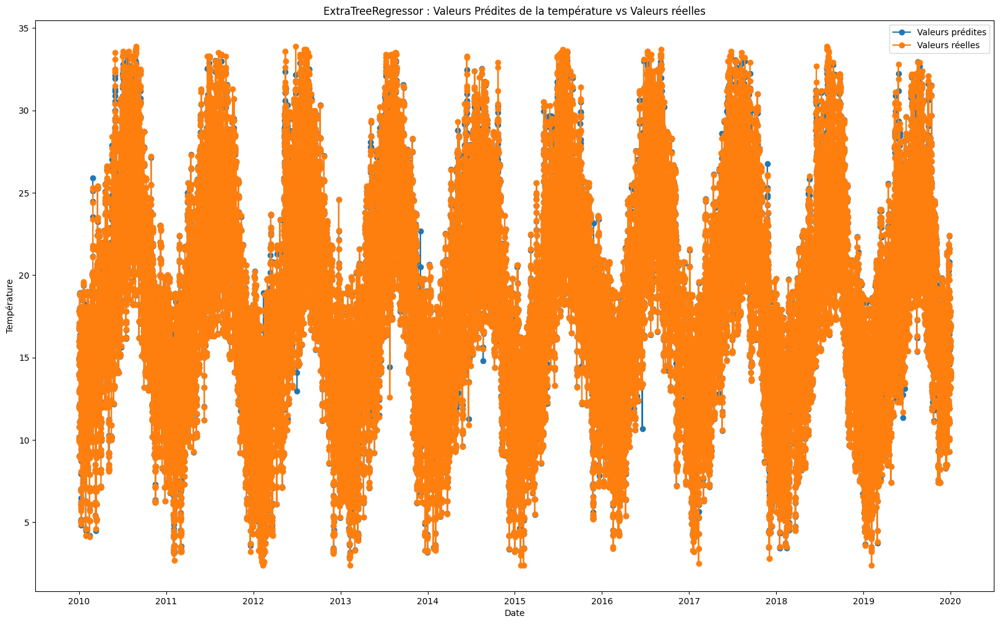

In [336]:
# Créer un graphe
plt.figure(figsize=(20, 12))

# Tracer les données d'entrainement
plt.plot(train_data.index, rf_predictions_train, label='Valeurs prédites', marker='o')


# Tracer les données d'entrainement
plt.plot(train_data.index, y_train, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('ExtraTreeRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

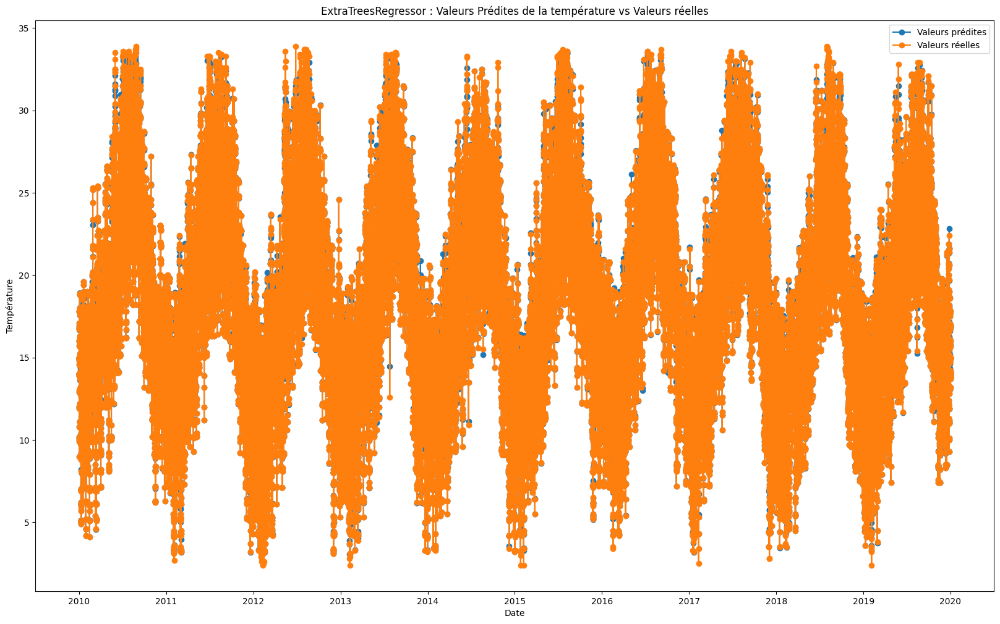

In [337]:
# Créer un graphe
plt.figure(figsize=(20, 12))

# Tracer les données d'entrainement
plt.plot(train_data.index, et_predictions_train, label='Valeurs prédites', marker='o')


# Tracer les données d'entrainement
plt.plot(train_data.index, y_train, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('ExtraTreesRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

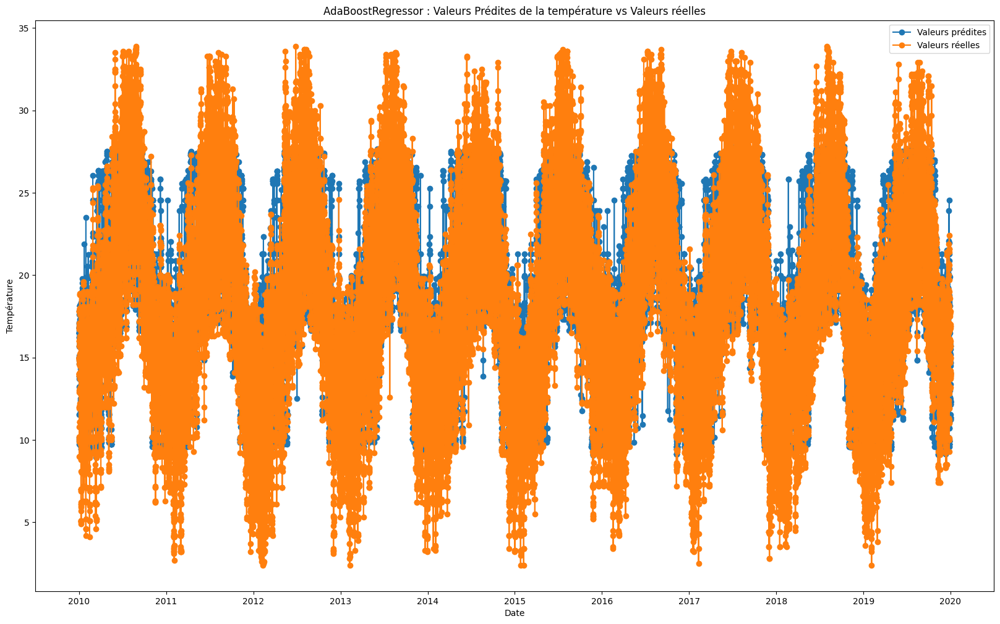

In [338]:
# Créer un graphe
plt.figure(figsize=(20, 12))

# Tracer les données d'entrainement
plt.plot(train_data.index, ada_predictions_train, label='Valeurs prédites', marker='o')


# Tracer les données d'entrainement
plt.plot(train_data.index, y_train, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('AdaBoostRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

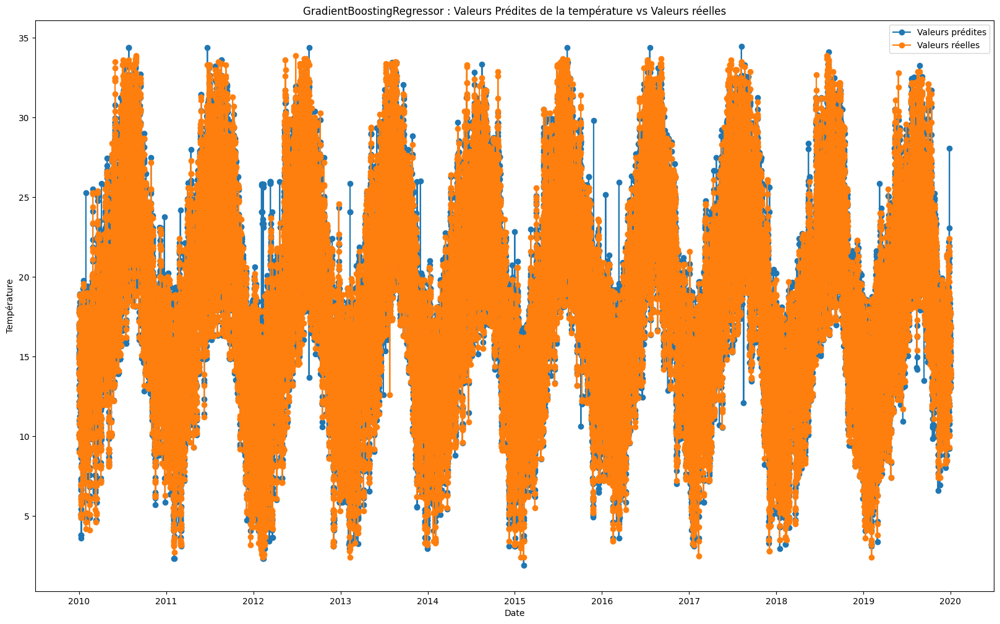

In [339]:
# Créer un graphe
plt.figure(figsize=(20, 12))

# Tracer les données d'entrainement
plt.plot(train_data.index, gb_predictions_train, label='Valeurs prédites', marker='o')


# Tracer les données d'entrainement
plt.plot(train_data.index, y_train, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('GradientBoostingRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

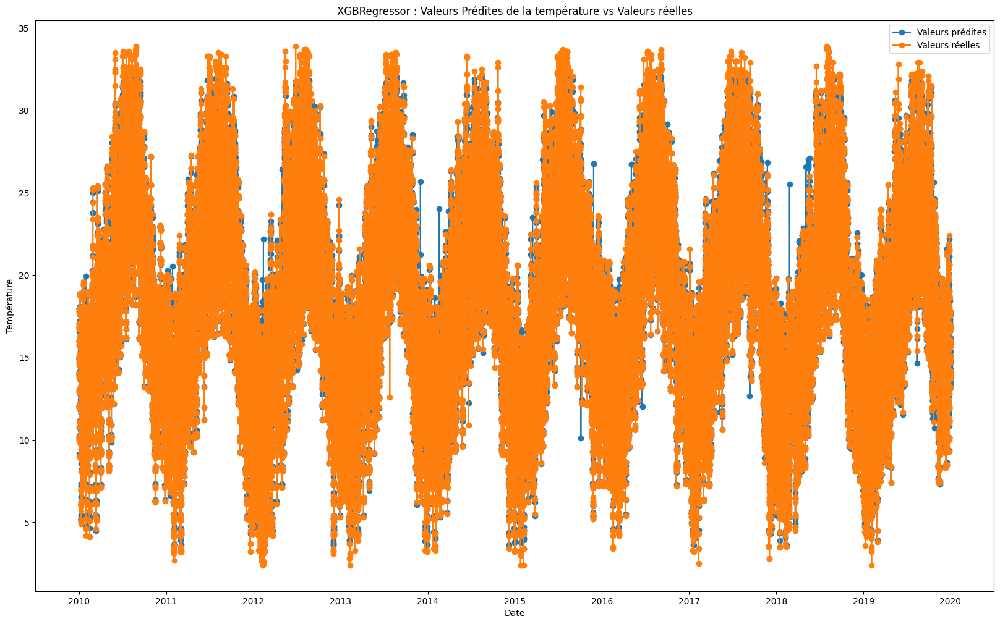

In [340]:
# Créer un graphe
plt.figure(figsize=(20, 12))

# Tracer les données d'entrainement
plt.plot(train_data.index, xgb_predictions_train, label='Valeurs prédites', marker='o')


# Tracer les données d'entrainement
plt.plot(train_data.index, y_train, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('XGBRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

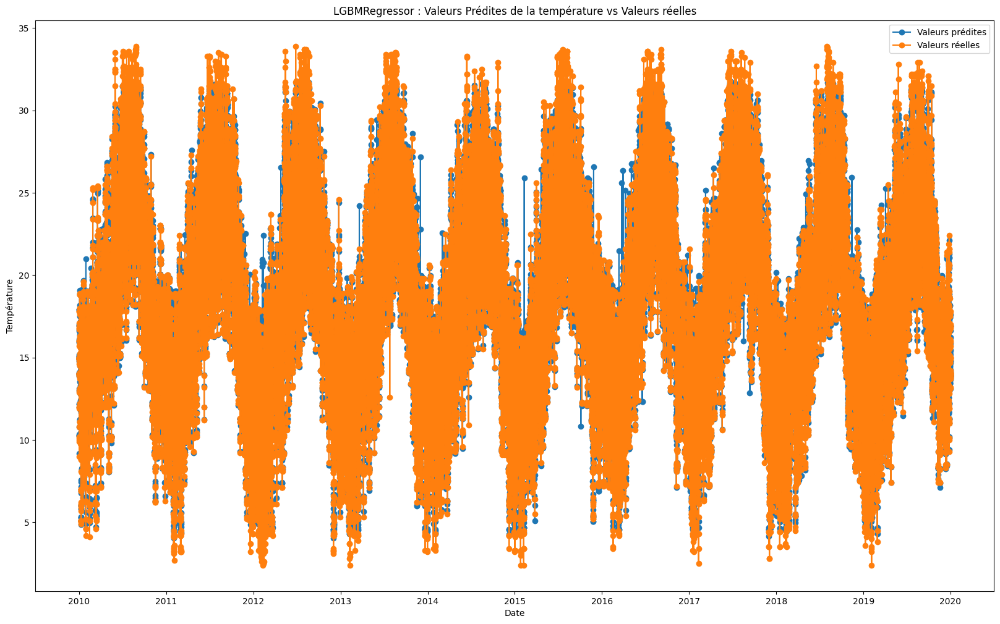

In [341]:
# Créer un graphe
plt.figure(figsize=(20, 12))


# Tracer les données de test
plt.plot(train_data.index, lgbm_predictions_train,  label='Valeurs prédites', marker='o')

# Tracer les données de test
plt.plot(train_data.index, y_train, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('LGBMRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

## **Comparaison des Modèles - Mean Squared Error (MSE) sur l'Ensemble d'Entraînement**

In [342]:
# Calculer les MSE pour chaque modèle
dt_mse_train = mean_squared_error(y_train, dt_predictions_train)
et_mse_train = mean_squared_error(y_train, et_predictions_train)
rf_mse_train = mean_squared_error(y_train, rf_predictions_train)
ada_mse_train = mean_squared_error(y_train, ada_predictions_train)
gb_mse_train = mean_squared_error(y_train, gb_predictions_train)
xgb_mse_train = mean_squared_error(y_train, xgb_predictions_train)
lgbm_mse_train = mean_squared_error(y_train, lgbm_predictions_train)

In [343]:
print("Comparaison des Modèles sur l'ensemble d'entrainement - Mean Squared Error (MSE) ==> DecisionTreeRegressor : ", dt_mse_train, ' , ExtraTreeRegressor : ', et_mse_train, ' , RandomForestRegressor : ',rf_mse_train, ' , AdaBoostRegressor : ',ada_mse_train, ' , GradientBoostingRegressor : ',gb_mse_train, ' , XGBRegressor : ',xgb_mse_train, ' , LGBMRegressor : ',lgbm_mse_train)

Comparaison des Modèles sur l'ensemble d'entrainement - Mean Squared Error (MSE) ==> DecisionTreeRegressor :  0.11494899606698344  , ExtraTreeRegressor :  0.03100517493598874  , RandomForestRegressor :  0.040404201375179805  , AdaBoostRegressor :  3.8976945490190493  , GradientBoostingRegressor :  0.5393813721936949  , XGBRegressor :  0.2514988336878986  , LGBMRegressor :  0.3707573053786734


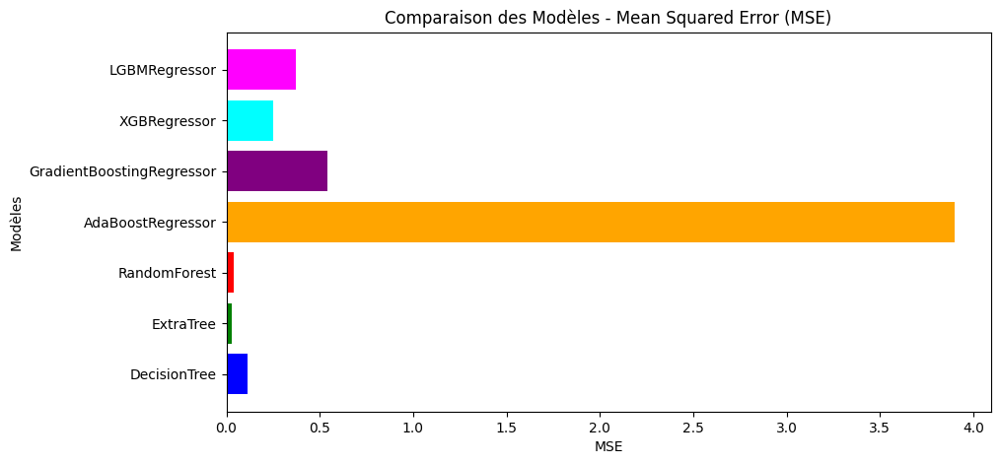

In [344]:
# Résultats fictifs à des fins d'exemple
models = ['DecisionTree', 'ExtraTree', 'RandomForest', 'AdaBoostRegressor', 'GradientBoostingRegressor', 'XGBRegressor', 'LGBMRegressor']
mse_scores_train = [dt_mse_train, et_mse_train, rf_mse_train, ada_mse_train , gb_mse_train, xgb_mse_train, lgbm_mse_train]  # Remplacez ces valeurs par les résultats réels

# Choix des couleurs pour chaque modèle
colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan', 'magenta']

# Création du graphique
plt.figure(figsize=(10, 5))
plt.barh(models, mse_scores_train, color=colors)
plt.title('Comparaison des Modèles - Mean Squared Error (MSE)')
plt.xlabel('MSE')
plt.ylabel('Modèles')
plt.show()


Les valeurs du Mean Squared Error (MSE) sur l'ensemble d'entraînement fournissent une mesure de la qualité des prédictions des modèles. Analysons ces résultats :

* **ExtraTreeRegressor : MSE = 0.0310**

  L'ExtraTreeRegressor présente la plus faible erreur quadratique moyenne parmi tous les modèles évalués. Cela suggère qu'il capture efficacement la structure des données et produit des prédictions précises sur l'ensemble d'entraînement.

* **RandomForestRegressor : MSE = 0.0404**

  Le RandomForestRegressor affiche une erreur quadratique moyenne légèrement plus élevée que l'ExtraTreeRegressor mais reste relativement faible. Cela indique une bonne performance de prédiction sur l'ensemble d'entraînement.

* **DecisionTreeRegressor : MSE = 0.1149**

  Le DecisionTreeRegressor a une erreur quadratique moyenne plus élevée que les deux modèles précédents mais reste raisonnablement basse. Il semble avoir une performance de prédiction solide sur l'ensemble d'entraînement.

* **XGBRegressor : MSE = 0.2515**

  Le XGBRegressor affiche une erreur quadratique moyenne plus élevée que les modèles précédents. Cela suggère qu'il a une performance de prédiction légèrement moins précise sur l'ensemble d'entraînement.

* **LGBMRegressor : MSE = 0.3708**

  Le LGBMRegressor présente une erreur quadratique moyenne plus élevée que les modèles précédents, indiquant une performance de prédiction moins précise sur l'ensemble d'entraînement.

* **GradientBoostingRegressor : MSE = 0.5394**

  Le GradientBoostingRegressor a la plus grande erreur quadratique moyenne parmi tous les modèles évalués. Cela suggère qu'il a la performance de prédiction la moins précise sur l'ensemble d'entraînement parmi les modèles examinés.

* **AdaBoostRegressor : MSE = 3.8977**

  L'AdaBoostRegressor affiche de loin la plus grande erreur quadratique moyenne parmi tous les modèles évalués. Cela indique une performance de prédiction très peu précise sur l'ensemble d'entraînement.

✅ L'ExtraTreeRegressor semble être le modèle le plus performant en termes de précision de prédiction sur l'ensemble d'entraînement, suivi du RandomForestRegressor et du DecisionTreeRegressor. Les modèles XGBRegressor, LGBMRegressor et GradientBoostingRegressor montrent une précision légèrement moins bonne, tandis que l'AdaBoostRegressor affiche la moins bonne performance de prédiction sur l'ensemble d'entraînement en raison de son MSE très élevé.



## **Comparaison des Modèles - Mean Absolute Error (MAE) sur l'Ensemble d'Entraînement**

In [345]:
# Calculer les MAE pour chaque modèle
dt_mae_train = mean_absolute_error(y_train, dt_predictions_train)
et_mae_train = mean_absolute_error(y_train, et_predictions_train)
rf_mae_train = mean_absolute_error(y_train, rf_predictions_train)
ada_mae_train = mean_absolute_error(y_train, ada_predictions_train)
gb_mae_train = mean_absolute_error(y_train, gb_predictions_train)
xgb_mae_train = mean_absolute_error(y_train, xgb_predictions_train)
lgbm_mae_train = mean_absolute_error(y_train, lgbm_predictions_train)

In [346]:
print("Comparaison des Modèles sur l'ensemble d'entrainement - Mean Absolute Error (MAE) ==> DecisionTreeRegressor : ", dt_mae_train, ' , ExtraTreeRegressor : ', et_mae_train, ' , RandomForestRegressor : ',rf_mae_train, ' , AdaBoostRegressor : ',ada_mae_train, ' , GradientBoostingRegressor : ',gb_mae_train, ' , XGBRegressor : ',xgb_mae_train, ' , LGBMRegressor : ',lgbm_mae_train)

Comparaison des Modèles sur l'ensemble d'entrainement - Mean Absolute Error (MAE) ==> DecisionTreeRegressor :  0.072892273717864  , ExtraTreeRegressor :  0.036971676372282915  , RandomForestRegressor :  0.0377294307860847  , AdaBoostRegressor :  1.5420406883703215  , GradientBoostingRegressor :  0.36727336805110816  , XGBRegressor :  0.14837333140841003  , LGBMRegressor :  0.2275580962740644


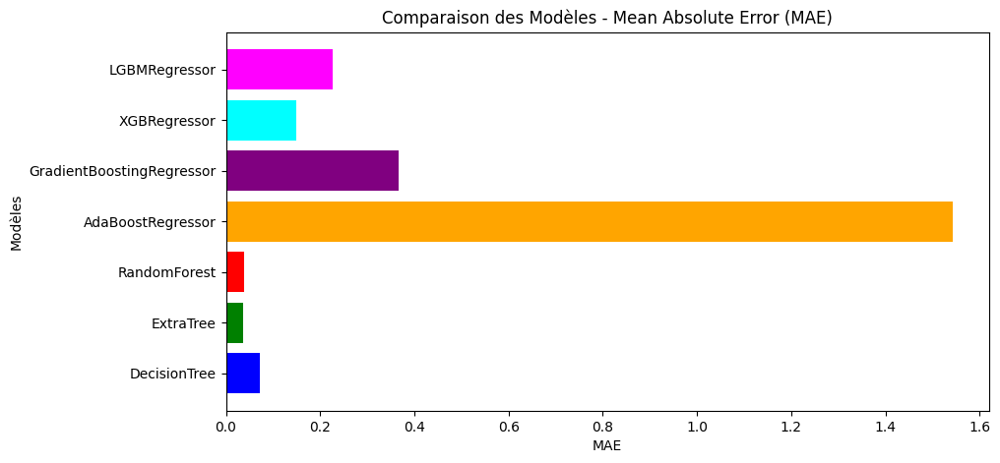

In [347]:
# Résultats fictifs à des fins d'exemple
models = ['DecisionTree', 'ExtraTree', 'RandomForest', 'AdaBoostRegressor', 'GradientBoostingRegressor', 'XGBRegressor', 'LGBMRegressor']
mae_scores_train = [dt_mae_train, et_mae_train, rf_mae_train, ada_mae_train , gb_mae_train, xgb_mae_train, lgbm_mae_train]  # Remplacez ces valeurs par les résultats réels

# Choix des couleurs pour chaque modèle
colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan', 'magenta']

# Création du graphique
plt.figure(figsize=(10, 5))
plt.barh(models, mae_scores_train, color=colors)
plt.title('Comparaison des Modèles - Mean Absolute Error (MAE)')
plt.xlabel('MAE')
plt.ylabel('Modèles')
plt.show()


Comparons les valeurs du Mean Absolute Error (MAE) sur l'ensemble d'entraînement pour chaque modèle :

* **ExtraTreeRegressor : MAE = 0.0370**

  L'ExtraTreeRegressor affiche la plus faible erreur absolue moyenne parmi tous les modèles évalués. Cela suggère qu'il produit des prédictions qui sont en moyenne éloignées de la valeur réelle de seulement 0.0370.

* **RandomForestRegressor : MAE = 0.0377**

  Le RandomForestRegressor a une erreur absolue moyenne similaire à l'ExtraTreeRegressor, ce qui indique également de bonnes performances de prédiction avec une erreur moyenne de seulement 0.0377.

* **DecisionTreeRegressor : MAE = 0.0729**

  Le DecisionTreeRegressor a une erreur absolue moyenne légèrement plus élevée que les deux modèles précédents, mais reste relativement basse avec une valeur de 0.0729.

* **XGBRegressor : MAE = 0.1484**

  Le XGBRegressor a une erreur absolue moyenne plus élevée que les modèles précédents, indiquant une performance de prédiction légèrement moins précise avec une erreur moyenne de 0.1484.

* **LGBMRegressor : MAE = 0.2276**

  Le LGBMRegressor présente une erreur absolue moyenne plus élevée que les modèles précédents, suggérant une performance de prédiction légèrement moins précise avec une erreur moyenne de 0.2276.

* **GradientBoostingRegressor : MAE = 0.3673**

  Le GradientBoostingRegressor affiche une erreur absolue moyenne plus élevée que les modèles précédents, indiquant une performance de prédiction moins précise avec une erreur moyenne de 0.3673.

* **AdaBoostRegressor : MAE = 1.5420**

  L'AdaBoostRegressor a de loin la plus grande erreur absolue moyenne parmi tous les modèles évalués, avec une valeur de 1.5420. Cela suggère que ses prédictions sont en moyenne beaucoup plus éloignées des valeurs réelles par rapport aux autres modèles examinés.

✅ L'ExtraTreeRegressor semble être le modèle le plus performant en termes de précision de prédiction sur l'ensemble d'entraînement, suivi du RandomForestRegressor et du DecisionTreeRegressor. Les autres modèles montrent une précision légèrement moins bonne, tandis que l'AdaBoostRegressor affiche la moins bonne performance de prédiction sur l'ensemble d'entraînement en raison de son MAE très élevé.

## **Comparaison des Modèles - R-squared sur l'Ensemble d'Entraînement**

In [348]:
# Calculer les R-squared pour chaque modèle
r2_dt_train = r2_score(y_train, dt_predictions_train)
r2_et_train = r2_score(y_train, et_predictions_train)
r2_rf_train = r2_score(y_train, rf_predictions_train)
r2_ada_train = r2_score(y_train, ada_predictions_train)
r2_gb_train = r2_score(y_train, gb_predictions_train)
r2_xgb_train = r2_score(y_train, xgb_predictions_train)
r2_lgbm_train = r2_score(y_train, lgbm_predictions_train)

In [349]:
print("Comparaison des Modèles sur l'ensemble d'entrainement - R-squared ==> DecisionTreeRegressor : ", r2_dt_train, ' , ExtraTreeRegressor : ', r2_et_train, ' , RandomForestRegressor : ',r2_rf_train, ' , AdaBoostRegressor : ',r2_ada_train, ' , GradientBoostingRegressor : ',r2_gb_train, ' , XGBRegressor : ',r2_xgb_train, ' , LGBMRegressor : ',r2_lgbm_train)

Comparaison des Modèles sur l'ensemble d'entrainement - R-squared ==> DecisionTreeRegressor :  0.996245677078891  , ExtraTreeRegressor :  0.9989873470589744  , RandomForestRegressor :  0.998680367601962  , AdaBoostRegressor :  0.8726982880621545  , GradientBoostingRegressor :  0.9823833881274964  , XGBRegressor :  0.9917858540026184  , LGBMRegressor :  0.9878907802818858


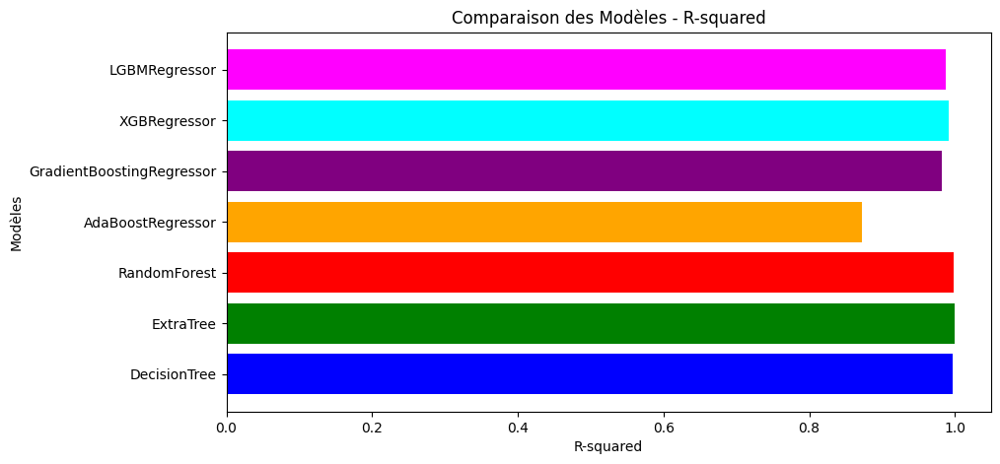

In [350]:
# Résultats fictifs à des fins d'exemple
models = ['DecisionTree', 'ExtraTree', 'RandomForest', 'AdaBoostRegressor', 'GradientBoostingRegressor', 'XGBRegressor', 'LGBMRegressor']
r2_scores_train = [r2_dt_train, r2_et_train, r2_rf_train, r2_ada_train , r2_gb_train, r2_xgb_train, r2_lgbm_train]  # Remplacez ces valeurs par les résultats réels

# Choix des couleurs pour chaque modèle
colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan', 'magenta']

# Création du graphique
plt.figure(figsize=(10, 5))
plt.barh(models, r2_scores_train, color=colors)
plt.title('Comparaison des Modèles - R-squared')
plt.xlabel('R-squared')
plt.ylabel('Modèles')
plt.show()


Analysons les résultats du coefficient de détermination (R-squared) pour chaque modèle de régression sur l'ensemble d'entraînement :

* **ExtraTreeRegressor : R-squared = 0.9990**

  L'ExtraTreeRegressor affiche le plus haut coefficient de détermination parmi tous les modèles évalués. Cela suggère que ce modèle explique très bien la variance des données et offre un ajustement exceptionnellement bon aux données d'entraînement.

* **RandomForestRegressor : R-squared = 0.9987**

  Le RandomForestRegressor a également un coefficient de détermination très élevé, indiquant un ajustement précis aux données d'entraînement avec une explication importante de la variance.

* **DecisionTreeRegressor : R-squared = 0.9962**

  Le DecisionTreeRegressor présente un coefficient de détermination légèrement inférieur aux deux modèles précédents, mais reste très élevé, indiquant un ajustement précis aux données d'entraînement.

* **XGBRegressor : R-squared = 0.9918**

  Le XGBRegressor a un coefficient de détermination légèrement inférieur, mais toujours très élevé, indiquant un bon ajustement aux données d'entraînement avec une explication considérable de la variance.

* **LGBMRegressor : R-squared = 0.9879**

  Le LGBMRegressor présente un coefficient de détermination légèrement inférieur, mais toujours très élevé, indiquant un bon ajustement aux données d'entraînement avec une explication notable de la variance.

* **GradientBoostingRegressor : R-squared = 0.9824**

  Le GradientBoostingRegressor a un coefficient de détermination légèrement inférieur, mais toujours élevé, indiquant un bon ajustement aux données d'entraînement avec une explication considérable de la variance.

* **AdaBoostRegressor : R-squared = 0.8727**

  L'AdaBoostRegressor a le plus bas coefficient de détermination parmi tous les modèles évalués, bien qu'il reste relativement élevé. Cela suggère que ce modèle explique moins bien la variance des données par rapport aux autres modèles examinés.

✅ L'ExtraTreeRegressor semble être le modèle le plus performant en termes d'ajustement et d'explication de la variance des données sur l'ensemble d'entraînement, suivi du RandomForestRegressor et du DecisionTreeRegressor. Les autres modèles montrent également de très bonnes performances, avec des coefficients de détermination élevés. L'AdaBoostRegressor a le coefficient de détermination le plus bas, mais il reste relativement élevé, ce qui indique également un ajustement raisonnable aux données d'entraînement.

# **Comparaison des models sur l'ensemble de Test**

In [351]:
# Faire des prédictions avec chaque modèle
dt_predictions_test = dt_model.predict(X_test)
et_predictions_test = et_model.predict(X_test)
rf_predictions_test = rf_model.predict(X_test)
ada_predictions_test = ada_model.predict(X_test)
gb_predictions_test = gb_model.predict(X_test)
xgb_predictions_test = xgb_model.predict(X_test)
lgbm_predictions_test = lgbm_model.predict(X_test)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


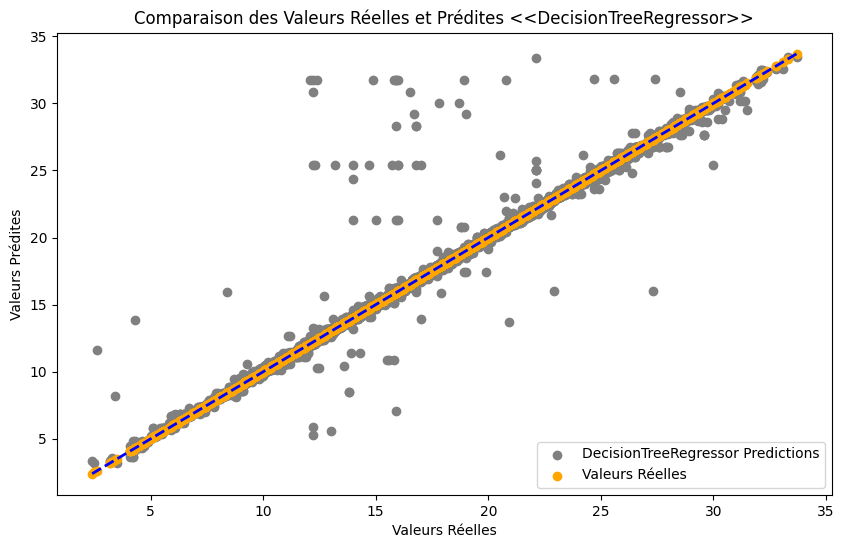

In [352]:
# Création du graphique
plt.figure(figsize=(10, 6))


# Tracé des valeurs prédites pour DecisionTreeRegressor
plt.scatter(y_test, dt_predictions_test, color='grey', label='DecisionTreeRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_test, y_test, color='orange', label='Valeurs Réelles')

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='blue', linewidth=2)

# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<DecisionTreeRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

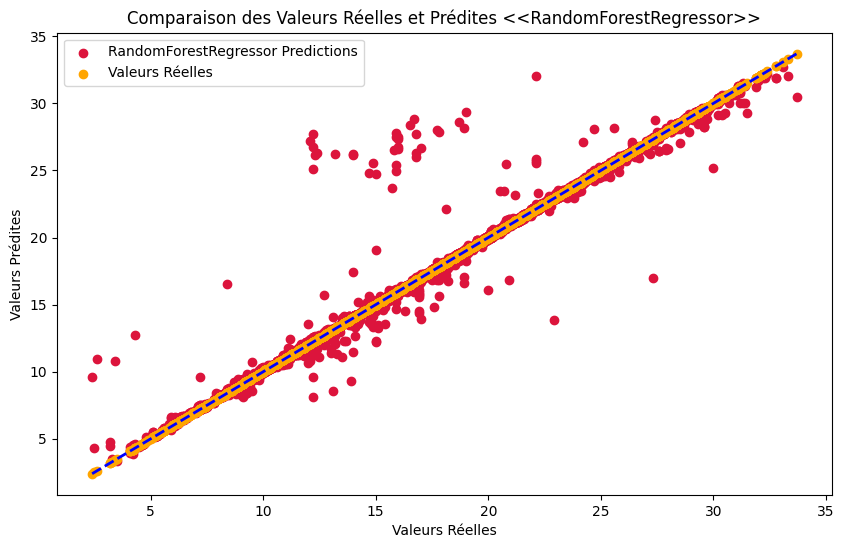

In [353]:
# Création du graphique
plt.figure(figsize=(10, 6))

# Tracé des valeurs prédites pour RandomForestRegressor
plt.scatter(y_test, rf_predictions_test, color='crimson', label='RandomForestRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_test, y_test, color='orange', label='Valeurs Réelles')

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='blue', linewidth=2)


# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<RandomForestRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

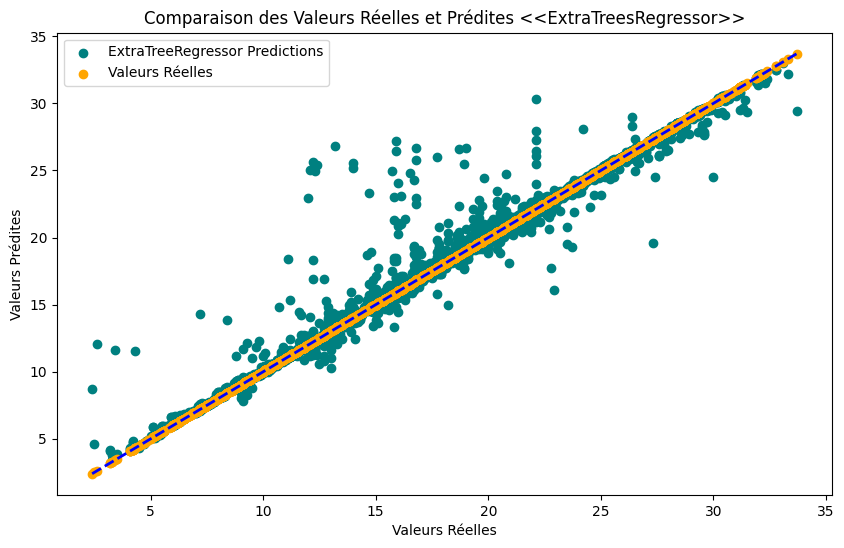

In [354]:
# Création du graphique
plt.figure(figsize=(10, 6))


# Tracé des valeurs prédites pour ExtraTreeRegressor
plt.scatter(y_test, et_predictions_test, color='teal', label='ExtraTreeRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_test, y_test, color='orange', label='Valeurs Réelles')

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='blue', linewidth=2)

# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<ExtraTreesRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

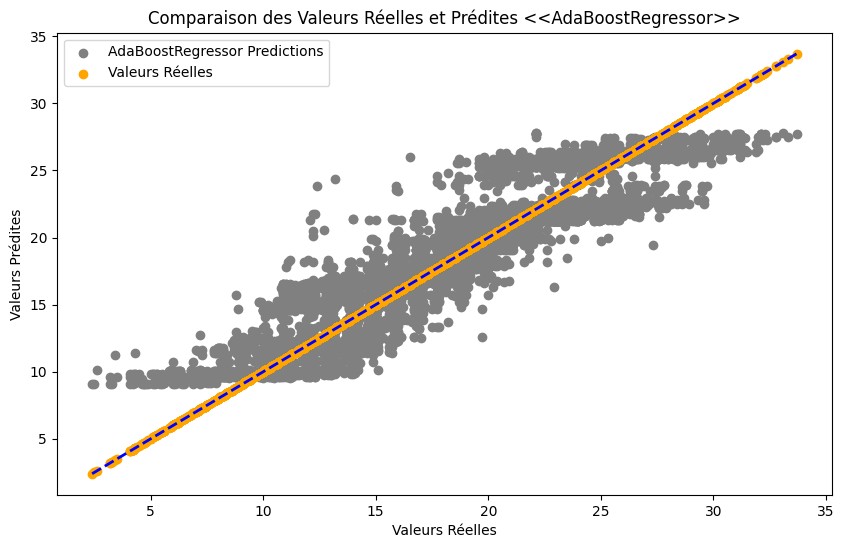

In [355]:
# Création du graphique
plt.figure(figsize=(10, 6))


# Tracé des valeurs prédites pour AdaBoostRegressor
plt.scatter(y_test, ada_predictions_test, color='grey', label='AdaBoostRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_test, y_test, color='orange', label='Valeurs Réelles')

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='blue', linewidth=2)

# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<AdaBoostRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

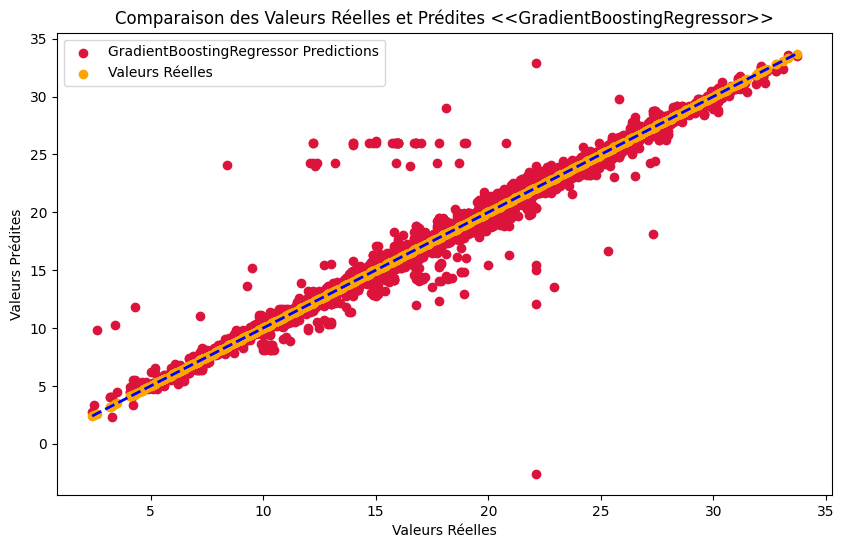

In [356]:
# Création du graphique
plt.figure(figsize=(10, 6))

# Tracé des valeurs prédites pour GradientBoostingRegressor
plt.scatter(y_test, gb_predictions_test, color='crimson', label='GradientBoostingRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_test, y_test, color='orange', label='Valeurs Réelles')

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='blue', linewidth=2)


# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<GradientBoostingRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

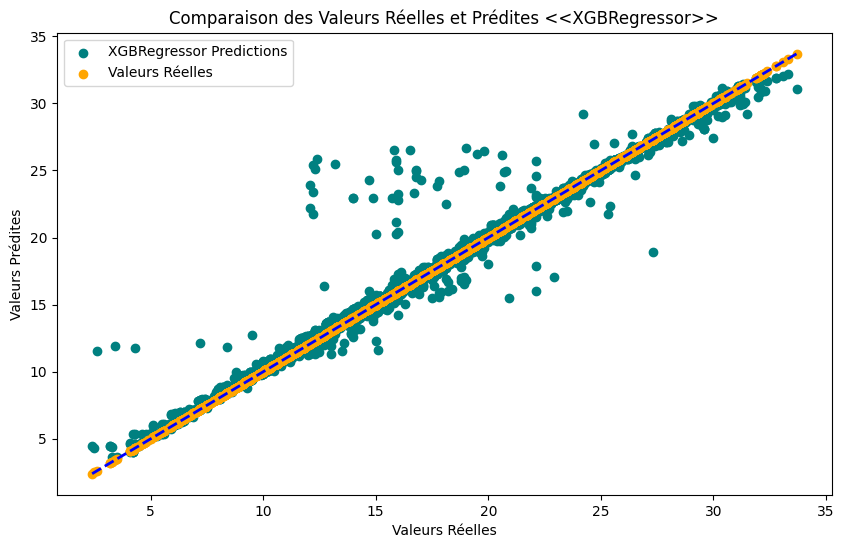

In [357]:
# Création du graphique
plt.figure(figsize=(10, 6))


# Tracé des valeurs prédites pour XGBRegressor
plt.scatter(y_test, xgb_predictions_test, color='teal', label='XGBRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_test, y_test, color='orange', label='Valeurs Réelles')

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='blue', linewidth=2)

# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<XGBRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

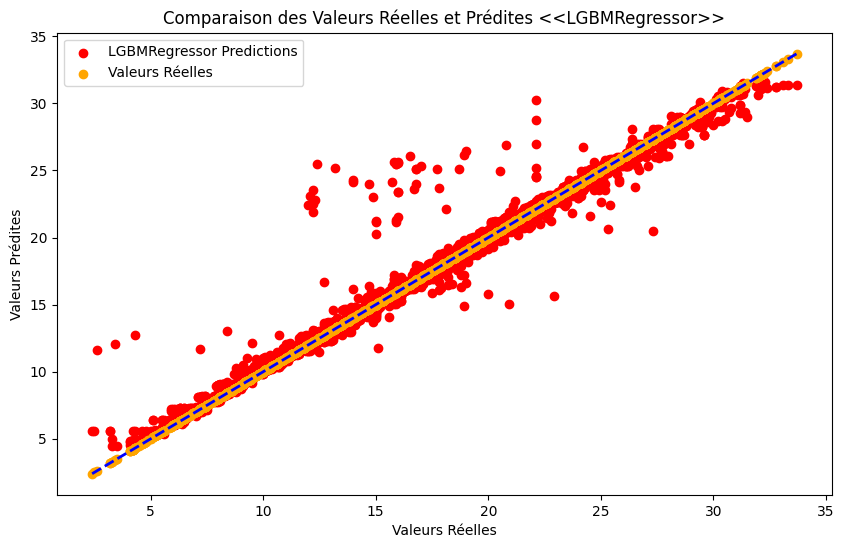

In [358]:
# Création du graphique
plt.figure(figsize=(10, 6))


# Tracé des valeurs prédites pour LGBMRegressor
plt.scatter(y_test, lgbm_predictions_test, color='red', label='LGBMRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_test, y_test, color='orange', label='Valeurs Réelles')

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='blue', linewidth=2)

# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<LGBMRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

## **Analyse des prédictions de température par modèle de régression sur les données de test**

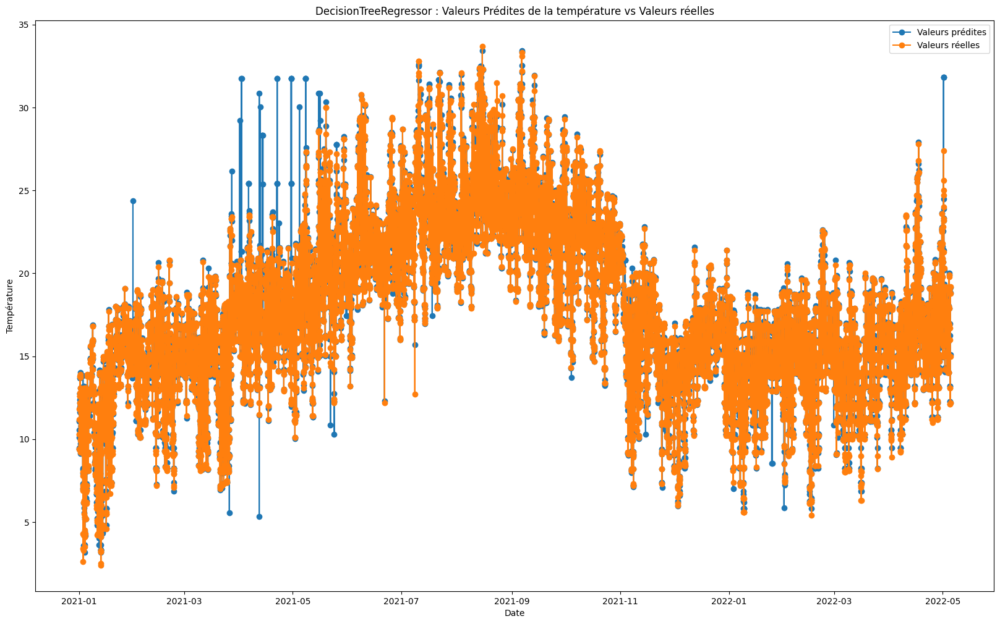

In [359]:
# Créer un graphe
plt.figure(figsize=(20, 12))

# Tracer les données de test
plt.plot(test_data.index, dt_predictions_test, label='Valeurs prédites', marker='o')


# Tracer les données de test
plt.plot(test_data.index, y_test, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('DecisionTreeRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

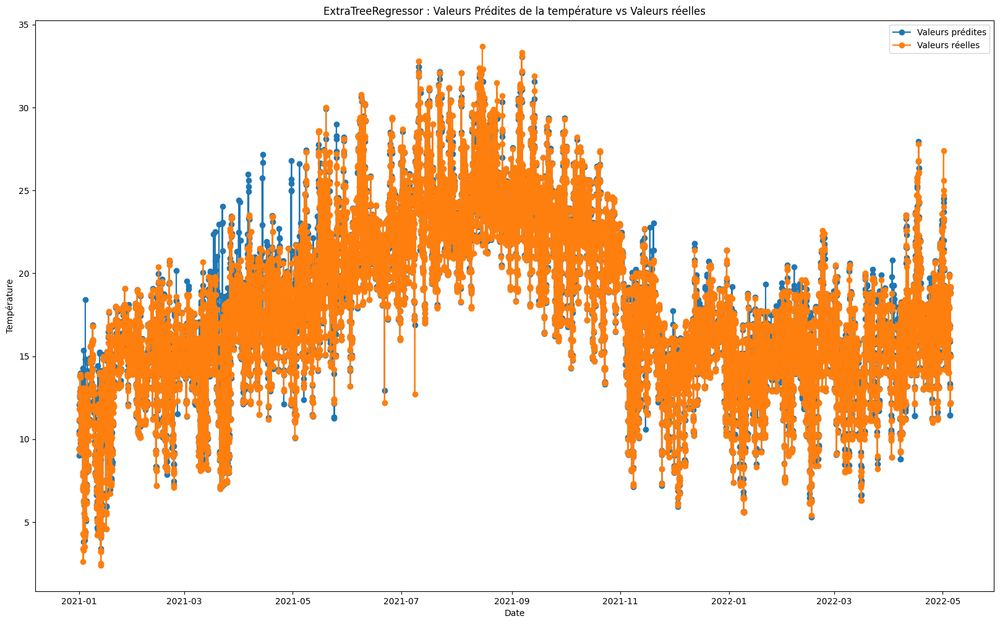

In [360]:
# Créer un graphe
plt.figure(figsize=(20, 12))

# Tracer les données de test
plt.plot(test_data.index, et_predictions_test, label='Valeurs prédites', marker='o')


# Tracer les données de test
plt.plot(test_data.index, y_test, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('ExtraTreeRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

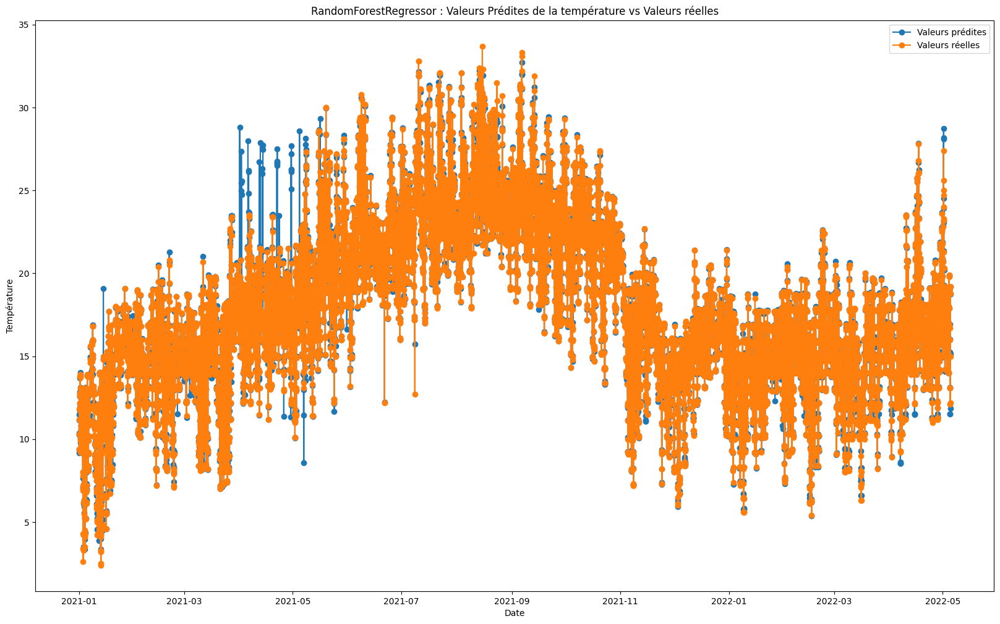

In [361]:
# Créer un graphe
plt.figure(figsize=(20, 12))


# Tracer les données de test
plt.plot(test_data.index, rf_predictions_test,  label='Valeurs prédites', marker='o')

# Tracer les données de test
plt.plot(test_data.index, y_test, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('RandomForestRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

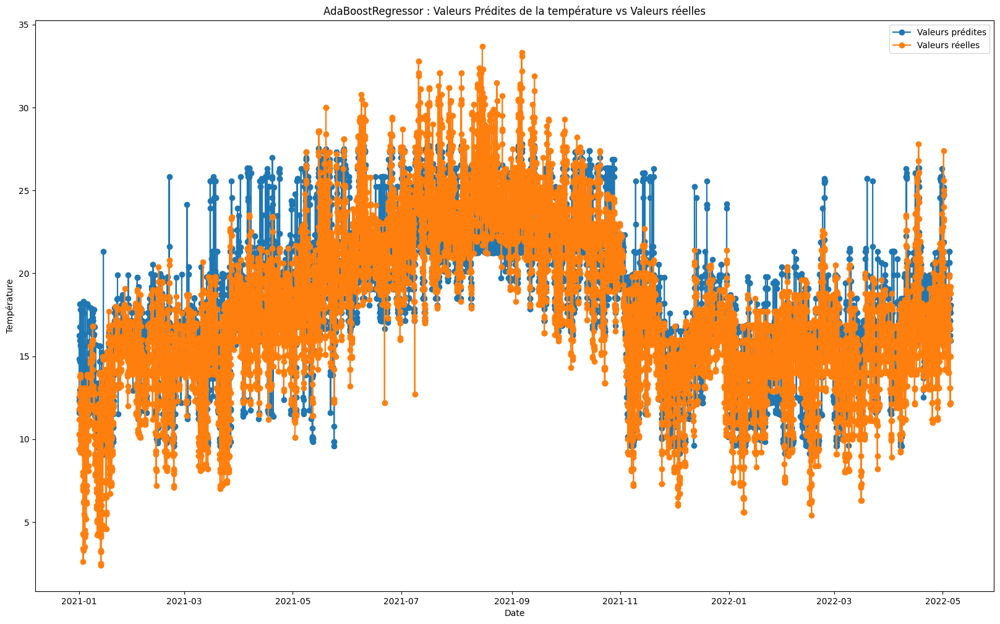

In [362]:
# Créer un graphe
plt.figure(figsize=(20, 12))

# Tracer les données de test
plt.plot(test_data.index, ada_predictions_test, label='Valeurs prédites', marker='o')


# Tracer les données de test
plt.plot(test_data.index, y_test, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('AdaBoostRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

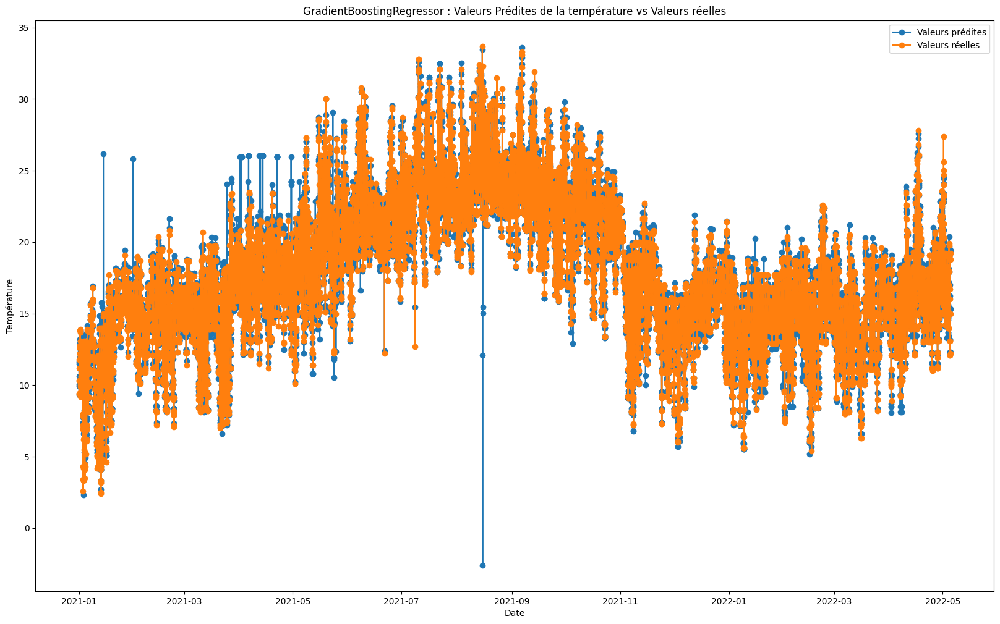

In [363]:
# Créer un graphe
plt.figure(figsize=(20, 12))

# Tracer les données de test
plt.plot(test_data.index, gb_predictions_test, label='Valeurs prédites', marker='o')


# Tracer les données de test
plt.plot(test_data.index, y_test, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('GradientBoostingRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

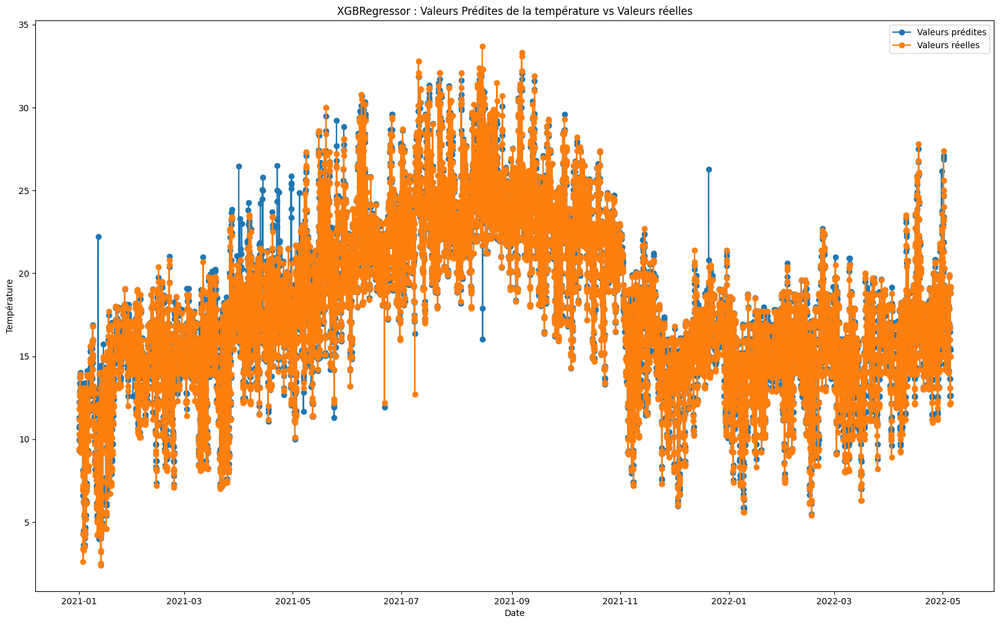

In [364]:
# Créer un graphe
plt.figure(figsize=(20, 12))


# Tracer les données de test
plt.plot(test_data.index, xgb_predictions_test,  label='Valeurs prédites', marker='o')

# Tracer les données de test
plt.plot(test_data.index, y_test, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('XGBRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

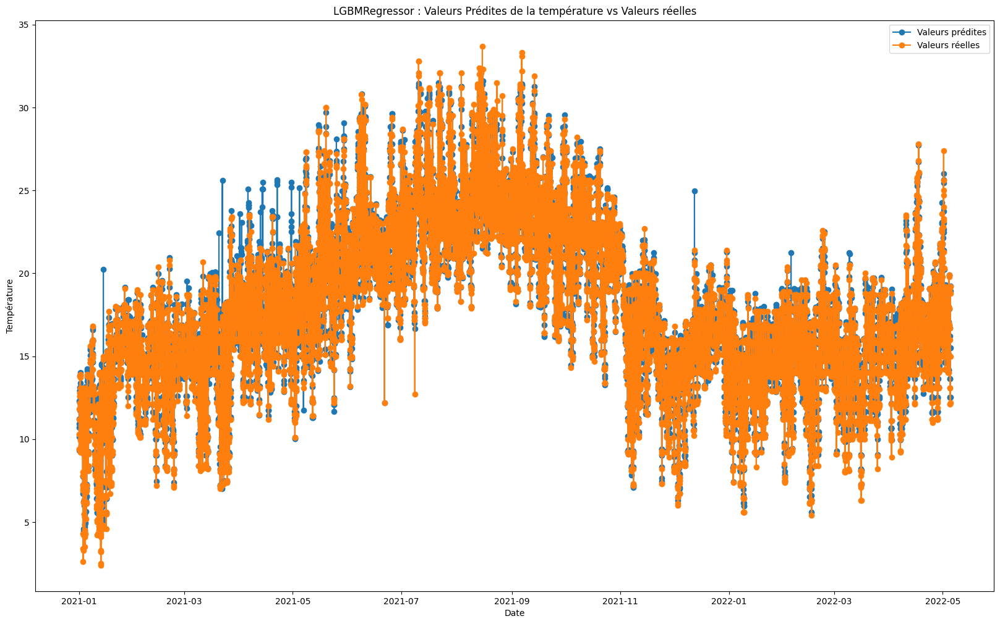

In [365]:
# Créer un graphe
plt.figure(figsize=(20, 12))


# Tracer les données de test
plt.plot(test_data.index, lgbm_predictions_test,  label='Valeurs prédites', marker='o')

# Tracer les données de test
plt.plot(test_data.index, y_test, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('LGBMRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

## **Comparaison des Modèles - Mean Squared Error (MSE) sur l'Ensemble de Test**

In [366]:
# Calculer les MSE pour chaque modèle
dt_mse_test = mean_squared_error(y_test, dt_predictions_test)
et_mse_test = mean_squared_error(y_test, et_predictions_test)
rf_mse_test = mean_squared_error(y_test, rf_predictions_test)
ada_mse_test = mean_squared_error(y_test, ada_predictions_test)
gb_mse_test = mean_squared_error(y_test, gb_predictions_test)
xgb_mse_test = mean_squared_error(y_test, xgb_predictions_test)
lgbm_mse_test = mean_squared_error(y_test, lgbm_predictions_test)

In [367]:
print("Comparaison des Modèles sur l'ensemble de test - Mean Squared Error (MSE) ==> DecisionTreeRegressor : ", dt_mse_test, ' , ExtraTreeRegressor : ', et_mse_test, ' , RandomForestRegressor : ',rf_mse_test, ' , AdaBoostRegressor : ',ada_mse_test, ' , GradientBoostingRegressor : ',gb_mse_test, ' , XGBRegressor : ',xgb_mse_test, ' , LGBMRegressor : ',lgbm_mse_test)

Comparaison des Modèles sur l'ensemble de test - Mean Squared Error (MSE) ==> DecisionTreeRegressor :  0.6102946102293524  , ExtraTreeRegressor :  0.37080190644815586  , RandomForestRegressor :  0.469177307104988  , AdaBoostRegressor :  4.143854899622849  , GradientBoostingRegressor :  0.6834222948654848  , XGBRegressor :  0.3475533162650207  , LGBMRegressor :  0.4028464933770343


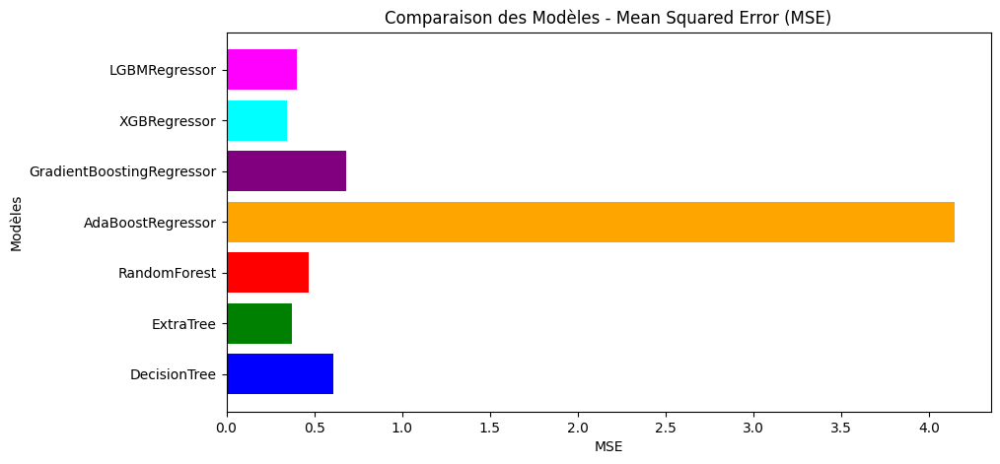

In [368]:
# Résultats fictifs à des fins d'exemple
models = ['DecisionTree', 'ExtraTree', 'RandomForest', 'AdaBoostRegressor', 'GradientBoostingRegressor', 'XGBRegressor', 'LGBMRegressor']
mse_scores_test = [dt_mse_test, et_mse_test, rf_mse_test, ada_mse_test , gb_mse_test, xgb_mse_test, lgbm_mse_test]  # Remplacez ces valeurs par les résultats réels

# Choix des couleurs pour chaque modèle
colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan', 'magenta']

# Création du graphique
plt.figure(figsize=(10, 5))
plt.barh(models, mse_scores_test, color=colors)
plt.title('Comparaison des Modèles - Mean Squared Error (MSE)')
plt.xlabel('MSE')
plt.ylabel('Modèles')
plt.show()

Analysons les résultats de l'erreur quadratique moyenne (MSE) pour chaque modèle de régression sur l'ensemble de test :

* **ExtraTreeRegressor : MSE = 0.3708**

  L'ExtraTreeRegressor affiche la plus faible erreur quadratique moyenne parmi tous les modèles évalués sur l'ensemble de test. Cela suggère qu'il a la meilleure performance de prédiction en termes de précision sur cet ensemble de données.

* **XGBRegressor : MSE = 0.3476**

  Le XGBRegressor a une erreur quadratique moyenne relativement faible, indiquant une performance de prédiction précise sur l'ensemble de test.

* **RandomForestRegressor : MSE = 0.4692**

  Le RandomForestRegressor a une erreur quadratique moyenne légèrement plus élevée que l'ExtraTreeRegressor et le XGBRegressor, mais reste relativement basse, ce qui indique également une bonne performance de prédiction sur l'ensemble de test.

* **LGBMRegressor : MSE = 0.4028**

  Le LGBMRegressor a une erreur quadratique moyenne légèrement plus élevée que le XGBRegressor, mais reste relativement basse, indiquant une performance de prédiction précise sur l'ensemble de test.

* **GradientBoostingRegressor : MSE = 0.6834**

  Le GradientBoostingRegressor affiche une erreur quadratique moyenne plus élevée, ce qui suggère une performance de prédiction moins précise sur l'ensemble de test par rapport aux modèles précédents.

* **DecisionTreeRegressor : MSE = 0.6103**

  Le DecisionTreeRegressor a une erreur quadratique moyenne plus élevée que la plupart des autres modèles, ce qui indique une performance de prédiction moins précise sur l'ensemble de test.

* **AdaBoostRegressor : MSE = 4.1439**

  L'AdaBoostRegressor a de loin la plus grande erreur quadratique moyenne parmi tous les modèles évalués sur l'ensemble de test, suggérant une performance de prédiction très peu précise sur cet ensemble de données.

▶▶ Sur la base de l'erreur quadratique moyenne sur l'ensemble de test, l'ExtraTreeRegressor semble être le modèle le plus performant, suivi du XGBRegressor, du RandomForestRegressor et du LGBMRegressor. Les autres modèles montrent des performances de prédiction moins précises sur l'ensemble de test, avec l'AdaBoostRegressor ayant la performance la moins précise en raison de sa MSE très élevée.

## **Comparaison des Modèles - Mean Absolute Error (MAE) sur l'Ensemble de Test**

In [369]:
# Calculer les MAE pour chaque modèle
dt_mae_test = mean_absolute_error(y_test, dt_predictions_test)
et_mae_test = mean_absolute_error(y_test, et_predictions_test)
rf_mae_test = mean_absolute_error(y_test, rf_predictions_test)
ada_mae_test = mean_absolute_error(y_test, ada_predictions_test)
gb_mae_test = mean_absolute_error(y_test, gb_predictions_test)
xgb_mae_test = mean_absolute_error(y_test, xgb_predictions_test)
lgbm_mae_test = mean_absolute_error(y_test, lgbm_predictions_test)

In [370]:
print("Comparaison des Modèles sur l'ensemble de test - Mean Absolute Error (MAE) ==> DecisionTreeRegressor : ", dt_mae_test, ' , ExtraTreeRegressor : ', et_mae_test, ' , RandomForestRegressor : ',rf_mae_test, ' , AdaBoostRegressor : ',ada_mae_test, ' , GradientBoostingRegressor : ',gb_mae_test, ' , XGBRegressor : ',xgb_mae_test, ' , LGBMRegressor : ',lgbm_mae_test)

Comparaison des Modèles sur l'ensemble de test - Mean Absolute Error (MAE) ==> DecisionTreeRegressor :  0.14188563055364117  , ExtraTreeRegressor :  0.14417960141123504  , RandomForestRegressor :  0.11777651227165856  , AdaBoostRegressor :  1.5848024079890155  , GradientBoostingRegressor :  0.35695070777001914  , XGBRegressor :  0.17776340893951387  , LGBMRegressor :  0.2478275639611562


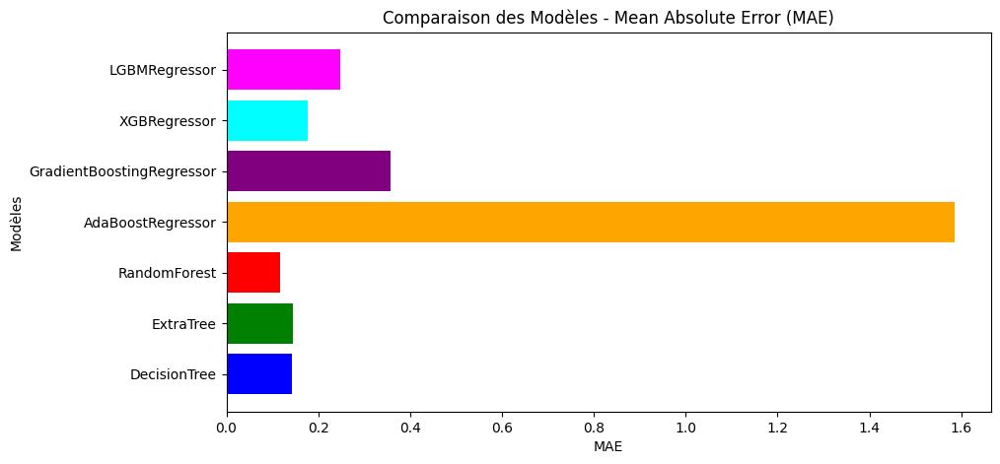

In [371]:
# Résultats fictifs à des fins d'exemple
models = ['DecisionTree', 'ExtraTree', 'RandomForest', 'AdaBoostRegressor', 'GradientBoostingRegressor', 'XGBRegressor', 'LGBMRegressor']
mae_scores_test = [dt_mae_test, et_mae_test, rf_mae_test, ada_mae_test , gb_mae_test, xgb_mae_test, lgbm_mae_test]  # Remplacez ces valeurs par les résultats réels

# Choix des couleurs pour chaque modèle
colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan', 'magenta']

# Création du graphique
plt.figure(figsize=(10, 5))
plt.barh(models, mae_scores_test, color=colors)
plt.title('Comparaison des Modèles - Mean Absolute Error (MAE)')
plt.xlabel('MAE')
plt.ylabel('Modèles')
plt.show()

Analysons les résultats de l'erreur absolue moyenne (MAE) pour chaque modèle de régression sur l'ensemble de test :

* **RandomForestRegressor : MAE = 0.1178**

  Le RandomForestRegressor affiche la plus faible erreur absolue moyenne parmi tous les modèles évalués sur l'ensemble de test. Cela suggère qu'il a la meilleure performance de prédiction en termes de précision sur cet ensemble de données.

* **XGBRegressor : MAE = 0.1778**

  Le XGBRegressor a une erreur absolue moyenne légèrement plus élevée que le RandomForestRegressor, mais reste relativement basse, indiquant également une bonne performance de prédiction sur l'ensemble de test.

* **LGBMRegressor : MAE = 0.2478**

  Le LGBMRegressor a une erreur absolue moyenne légèrement plus élevée que le XGBRegressor, mais reste relativement basse, indiquant également une bonne performance de prédiction sur l'ensemble de test.

* **GradientBoostingRegressor : MAE = 0.3569**

  Le GradientBoostingRegressor affiche une erreur absolue moyenne plus élevée, ce qui suggère une performance de prédiction moins précise sur l'ensemble de test par rapport aux modèles précédents.

* **DecisionTreeRegressor : MAE = 0.1419**

  Le DecisionTreeRegressor a une erreur absolue moyenne légèrement plus élevée que le RandomForestRegressor, mais reste relativement basse, ce qui suggère également une bonne performance de prédiction sur l'ensemble de test.

* **ExtraTreeRegressor : MAE = 0.1442**

  L'ExtraTreeRegressor a une erreur absolue moyenne légèrement plus élevée que le DecisionTreeRegressor, mais reste relativement basse, indiquant également une bonne performance de prédiction sur l'ensemble de test.

* **AdaBoostRegressor : MAE = 1.5848**

  L'AdaBoostRegressor a de loin la plus grande erreur absolue moyenne parmi tous les modèles évalués sur l'ensemble de test, suggérant une performance de prédiction très peu précise sur cet ensemble de données.
  
▶▶ Sur la base de l'erreur absolue moyenne sur l'ensemble de test, le RandomForestRegressor semble être le modèle le plus performant, suivi du XGBRegressor et du LGBMRegressor. Les autres modèles montrent également des performances de prédiction relativement précises sur l'ensemble de test, à l'exception de l'AdaBoostRegressor, qui a la performance la moins précise en raison de son MAE très élevé.

In [372]:
# Calculer les R-squared pour chaque modèle
r2_dt_test = r2_score(y_test, dt_predictions_test)
r2_et_test = r2_score(y_test, et_predictions_test)
r2_rf_test = r2_score(y_test, rf_predictions_test)
r2_ada_test = r2_score(y_test, ada_predictions_test)
r2_gb_test = r2_score(y_test, gb_predictions_test)
r2_xgb_test = r2_score(y_test, xgb_predictions_test)
r2_lgbm_test = r2_score(y_test, lgbm_predictions_test)

In [373]:
print("Comparaison des Modèles sur l'ensemble de test - R-squared ==> DecisionTreeRegressor : ", r2_dt_test, ' , ExtraTreeRegressor : ', r2_et_test, ' , RandomForestRegressor : ',r2_rf_test, ' , AdaBoostRegressor : ',r2_ada_test, ' , GradientBoostingRegressor : ',r2_gb_test, ' , XGBRegressor : ',r2_xgb_test, ' , LGBMRegressor : ',r2_lgbm_test)

Comparaison des Modèles sur l'ensemble de test - R-squared ==> DecisionTreeRegressor :  0.9741443882407055  , ExtraTreeRegressor :  0.9842906852329454  , RandomForestRegressor :  0.9801229339151152  , AdaBoostRegressor :  0.8244423239601701  , GradientBoostingRegressor :  0.9710462762942516  , XGBRegressor :  0.9852756300639348  , LGBMRegressor :  0.9829330910731204


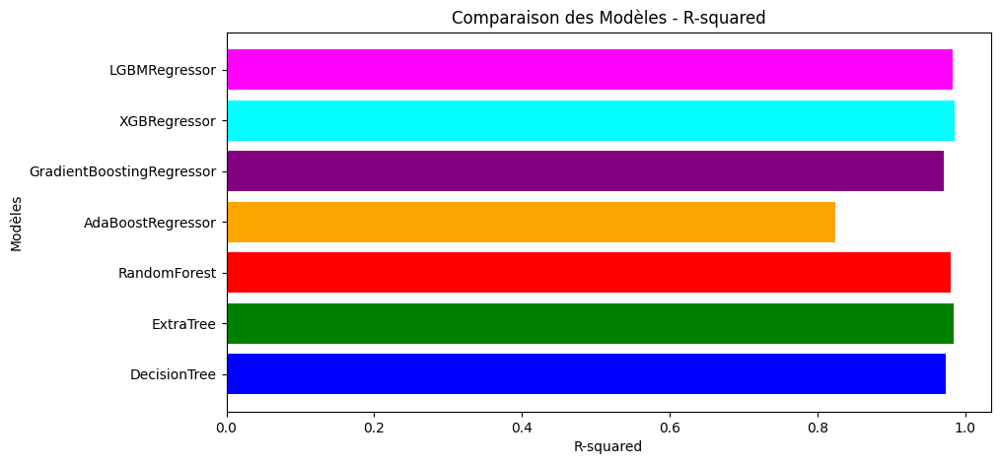

In [374]:
models = ['DecisionTree', 'ExtraTree', 'RandomForest', 'AdaBoostRegressor', 'GradientBoostingRegressor', 'XGBRegressor', 'LGBMRegressor']
r2_scores_test = [r2_dt_test, r2_et_test, r2_rf_test, r2_ada_test , r2_gb_test, r2_xgb_test, r2_lgbm_test]  # Remplacez ces valeurs par les résultats réels

# Choix des couleurs pour chaque modèle
colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan', 'magenta']

# Création du graphique
plt.figure(figsize=(10, 5))
plt.barh(models, r2_scores_test, color=colors)
plt.title('Comparaison des Modèles - R-squared')
plt.xlabel('R-squared')
plt.ylabel('Modèles')
plt.show()

Analysons les résultats du coefficient de détermination (R-squared) pour chaque modèle de régression sur l'ensemble de test :

* **ExtraTreeRegressor : R-squared = 0.9843**

  L'ExtraTreeRegressor affiche le plus haut coefficient de détermination parmi tous les modèles évalués sur l'ensemble de test. Cela suggère que ce modèle explique très bien la variance des données et offre un ajustement exceptionnellement bon aux données de test.

* **XGBRegressor : R-squared = 0.9853**

  Le XGBRegressor a un coefficient de détermination légèrement plus élevé que le ExtraTreeRegressor, ce qui indique également un ajustement précis aux données de test avec une explication importante de la variance.

* **LGBMRegressor : R-squared = 0.9829**

  Le LGBMRegressor a un coefficient de détermination légèrement inférieur au XGBRegressor mais reste très élevé, indiquant également un ajustement précis aux données de test avec une explication considérable de la variance.

* **RandomForestRegressor : R-squared = 0.9801**

  Le RandomForestRegressor affiche un coefficient de détermination légèrement inférieur au LGBMRegressor, mais reste très élevé, indiquant également un ajustement précis aux données de test avec une explication considérable de la variance.

* **DecisionTreeRegressor : R-squared = 0.9741**

  Le DecisionTreeRegressor a un coefficient de détermination légèrement inférieur au RandomForestRegressor, mais reste très élevé, indiquant également un ajustement précis aux données de test avec une explication considérable de la variance.

* **GradientBoostingRegressor : R-squared = 0.9710**

  Le GradientBoostingRegressor affiche un coefficient de détermination légèrement inférieur au DecisionTreeRegressor, mais reste très élevé, indiquant également un ajustement précis aux données de test avec une explication considérable de la variance.

* **AdaBoostRegressor : R-squared = 0.8244**

  L'AdaBoostRegressor a le plus bas coefficient de détermination parmi tous les modèles évalués, bien qu'il reste relativement élevé. Cela suggère que ce modèle explique moins bien la variance des données par rapport aux autres modèles examinés.

▶▶ Sur la base du coefficient de détermination sur l'ensemble de test, le XGBRegressor semble être le modèle le plus performant, suivi de près par l'ExtraTreeRegressor et le LGBMRegressor. Les autres modèles montrent également des performances élevées en termes d'ajustement aux données de test, avec l'AdaBoostRegressor ayant la performance la moins précise en raison de son R-squared plus faible.

# **Comparaison des models sur l'ensemble de validation**

In [375]:
# Faire des prédictions avec chaque modèle
dt_predictions_val = dt_model.predict(X_val)
et_predictions_val = et_model.predict(X_val)
rf_predictions_val = rf_model.predict(X_val)
ada_predictions_val = ada_model.predict(X_val)
gb_predictions_val = gb_model.predict(X_val)
xgb_predictions_val = xgb_model.predict(X_val)
lgbm_predictions_val = lgbm_model.predict(X_val)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


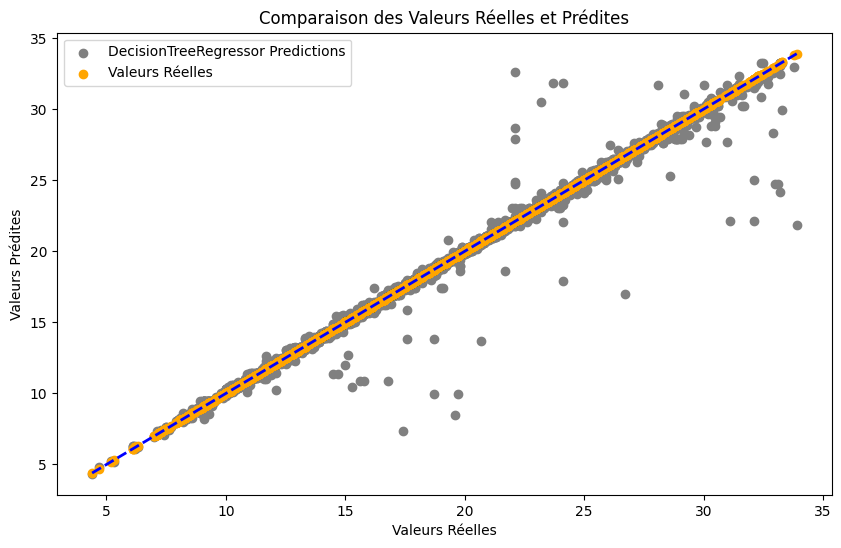

In [376]:
# Création du graphique
plt.figure(figsize=(10, 6))


# Tracé des valeurs prédites pour DecisionTreeRegressor
plt.scatter(y_val, dt_predictions_val, color='grey', label='DecisionTreeRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_val, y_val, color='orange', label='Valeurs Réelles')

plt.plot([min(y_val), max(y_val)], [min(y_val), max(y_val)], linestyle='--', color='blue', linewidth=2)

# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

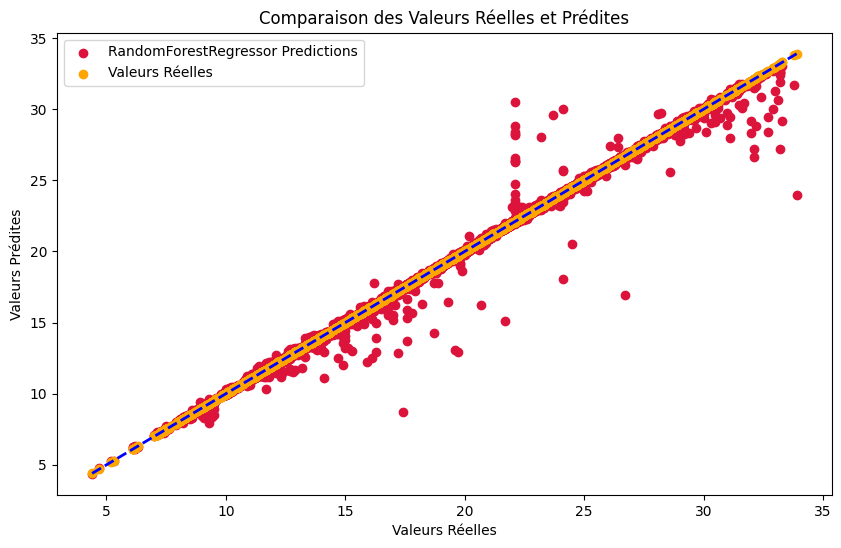

In [377]:
# Création du graphique
plt.figure(figsize=(10, 6))

# Tracé des valeurs prédites pour RandomForestRegressor
plt.scatter(y_val, rf_predictions_val, color='crimson', label='RandomForestRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_val, y_val, color='orange', label='Valeurs Réelles')

plt.plot([min(y_val), max(y_val)], [min(y_val), max(y_val)], linestyle='--', color='blue', linewidth=2)


# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

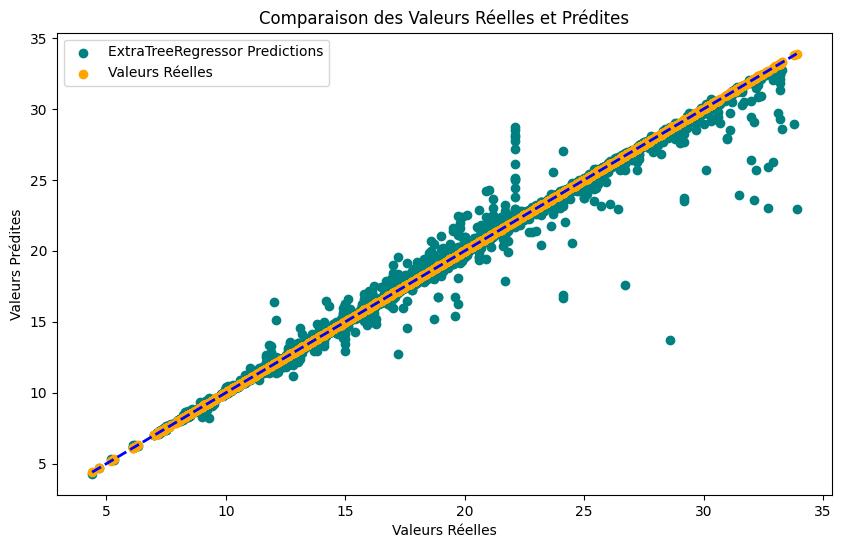

In [378]:
# Création du graphique
plt.figure(figsize=(10, 6))


# Tracé des valeurs prédites pour ExtraTreeRegressor
plt.scatter(y_val, et_predictions_val, color='teal', label='ExtraTreeRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_val, y_val, color='orange', label='Valeurs Réelles')

plt.plot([min(y_val), max(y_val)], [min(y_val), max(y_val)], linestyle='--', color='blue', linewidth=2)

# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

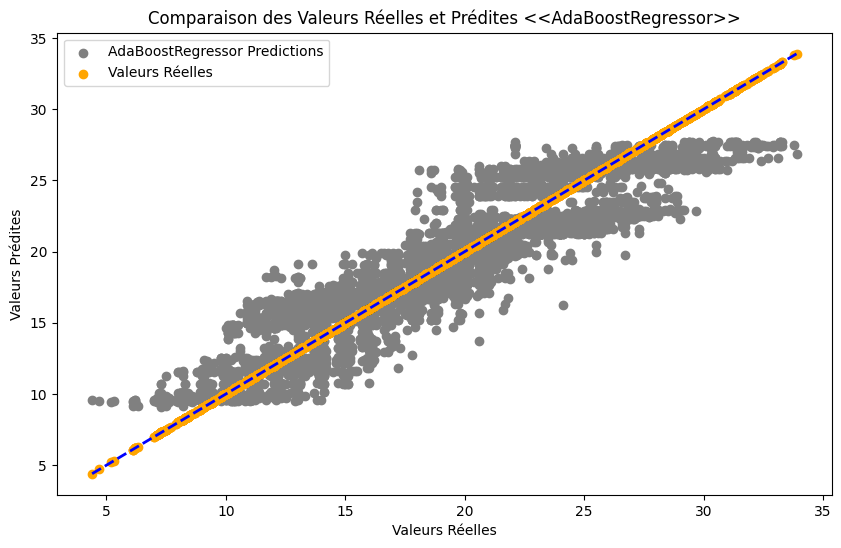

In [379]:
# Création du graphique
plt.figure(figsize=(10, 6))


# Tracé des valeurs prédites pour AdaBoostRegressor
plt.scatter(y_val, ada_predictions_val, color='grey', label='AdaBoostRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_val, y_val, color='orange', label='Valeurs Réelles')

plt.plot([min(y_val), max(y_val)], [min(y_val), max(y_val)], linestyle='--', color='blue', linewidth=2)

# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<AdaBoostRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

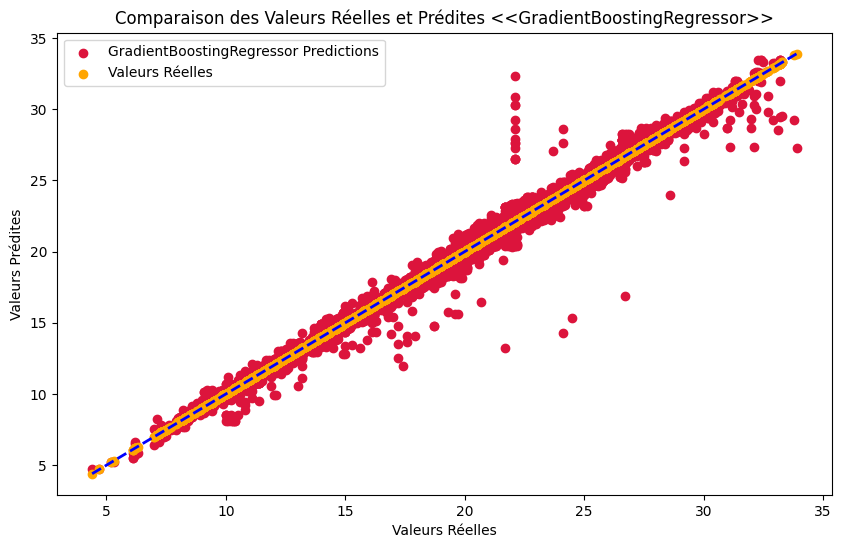

In [380]:
# Création du graphique
plt.figure(figsize=(10, 6))

# Tracé des valeurs prédites pour GradientBoostingRegressor
plt.scatter(y_val, gb_predictions_val, color='crimson', label='GradientBoostingRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_val, y_val, color='orange', label='Valeurs Réelles')

plt.plot([min(y_val), max(y_val)], [min(y_val), max(y_val)], linestyle='--', color='blue', linewidth=2)


# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<GradientBoostingRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

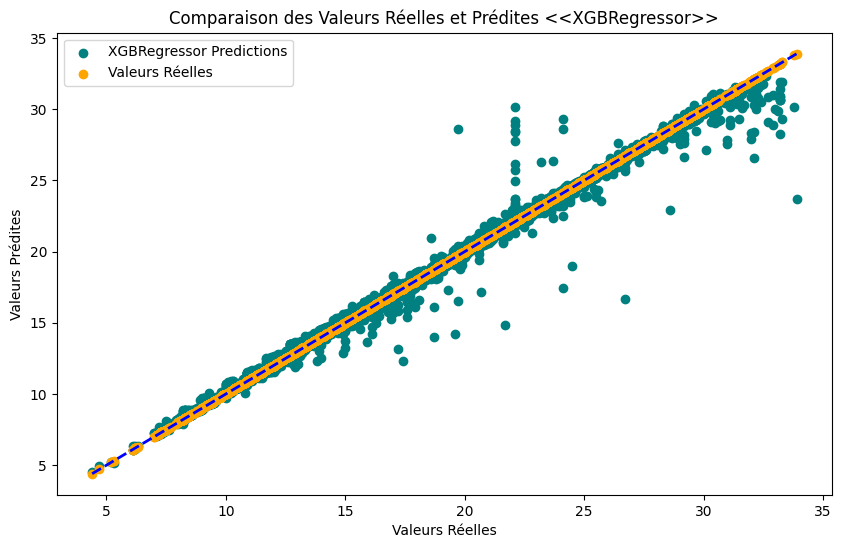

In [381]:
# Création du graphique
plt.figure(figsize=(10, 6))


# Tracé des valeurs prédites pour XGBRegressor
plt.scatter(y_val, xgb_predictions_val, color='teal', label='XGBRegressor Predictions')

# Tracé des valeurs réelles
plt.scatter(y_val, y_val, color='orange', label='Valeurs Réelles')

plt.plot([min(y_val), max(y_val)], [min(y_val), max(y_val)], linestyle='--', color='blue', linewidth=2)

# Ajout de labels et du titre
plt.title('Comparaison des Valeurs Réelles et Prédites <<XGBRegressor>>')
plt.xlabel('Valeurs Réelles')
plt.ylabel('Valeurs Prédites')

# Ajout de la légende
plt.legend()

# Affichage du graphique
plt.show()

## **Analyse des prédictions de température par modèle de régression sur les données de validation**

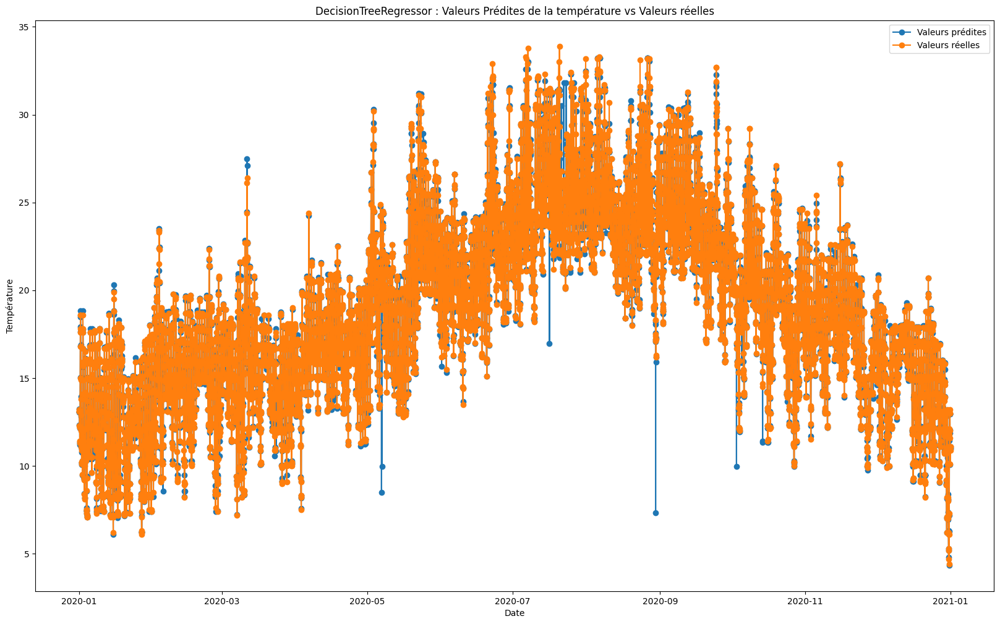

In [382]:
# Créer un graphe
plt.figure(figsize=(20, 12))

# Tracer les données de validation
plt.plot(val_data.index, dt_predictions_val, label='Valeurs prédites', marker='o')


# Tracer les données de validation
plt.plot(val_data.index, y_val, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('DecisionTreeRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

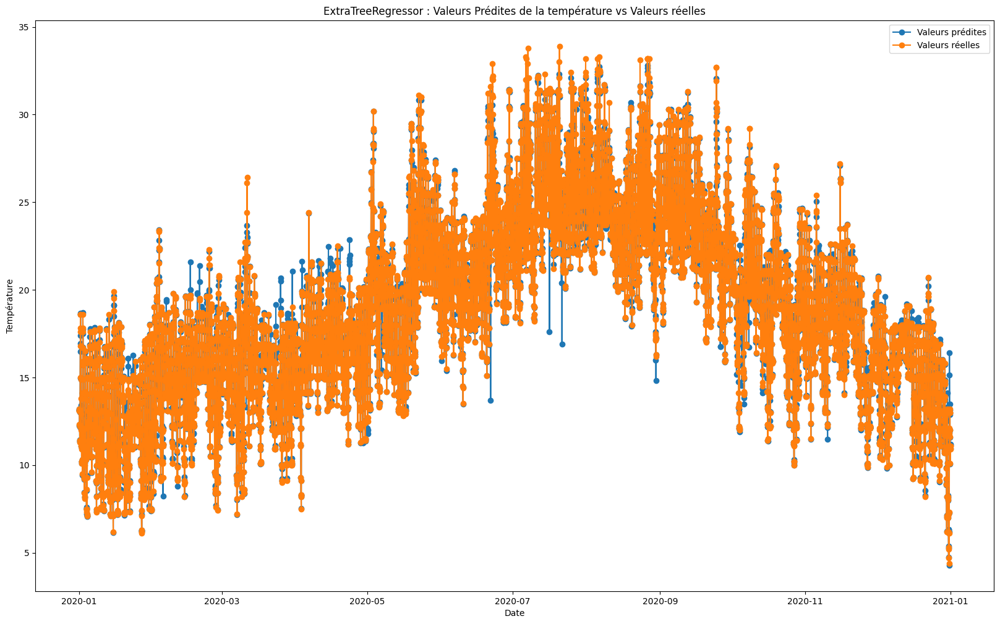

In [383]:
# Créer un graphe
plt.figure(figsize=(20, 12))

# Tracer les données de validation
plt.plot(val_data.index, et_predictions_val, label='Valeurs prédites', marker='o')


# Tracer les données de validation
plt.plot(val_data.index, y_val, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('ExtraTreeRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

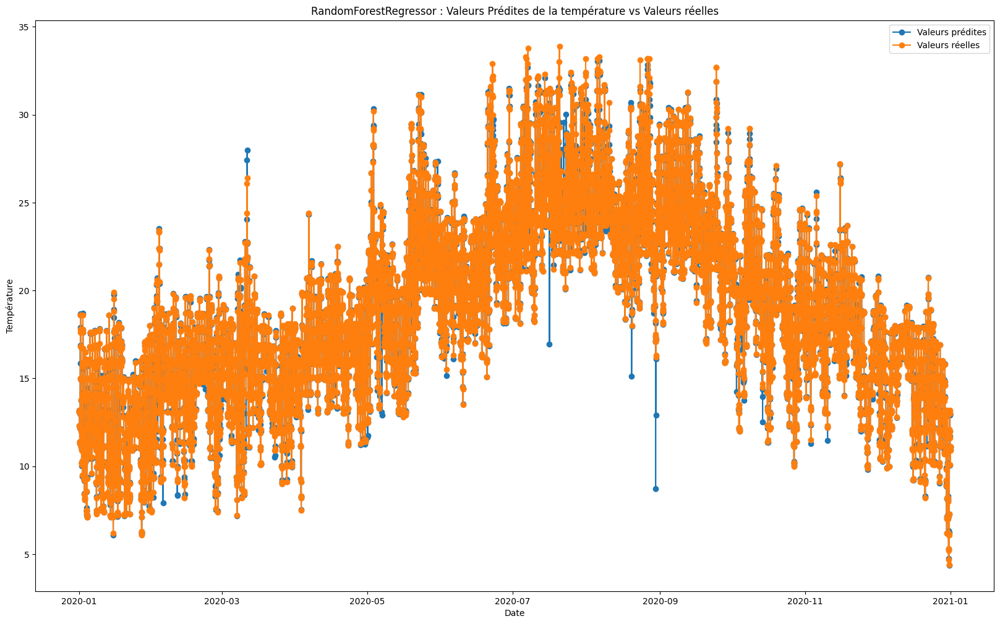

In [384]:
# Créer un graphe
plt.figure(figsize=(20, 12))


# Tracer les données de validation
plt.plot(val_data.index, rf_predictions_val,  label='Valeurs prédites', marker='o')

# Tracer les données de validation
plt.plot(val_data.index, y_val, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('RandomForestRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

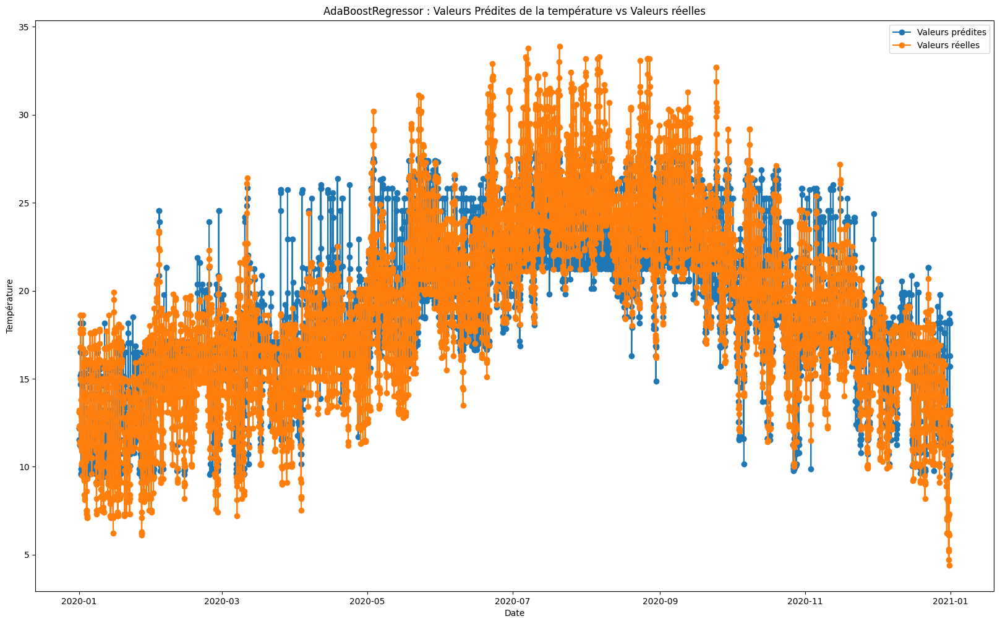

In [385]:
# Créer un graphe
plt.figure(figsize=(20, 12))

# Tracer les données de validation
plt.plot(val_data.index, ada_predictions_val, label='Valeurs prédites', marker='o')


# Tracer les données de validation
plt.plot(val_data.index, y_val, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('AdaBoostRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

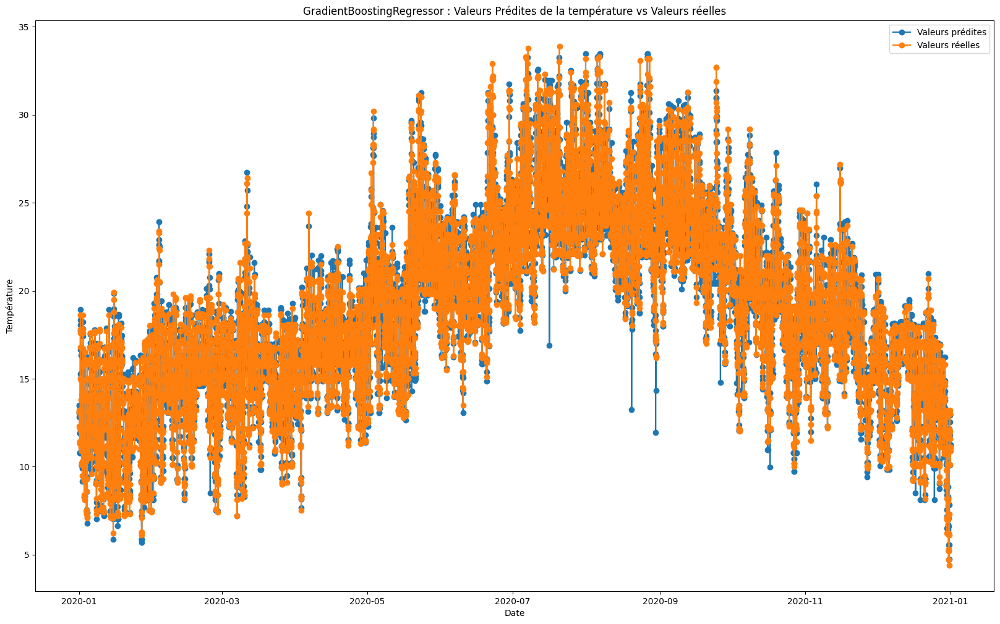

In [386]:
# Créer un graphe
plt.figure(figsize=(20, 12))

# Tracer les données de validation
plt.plot(val_data.index, gb_predictions_val, label='Valeurs prédites', marker='o')


# Tracer les données de validation
plt.plot(val_data.index, y_val, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('GradientBoostingRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

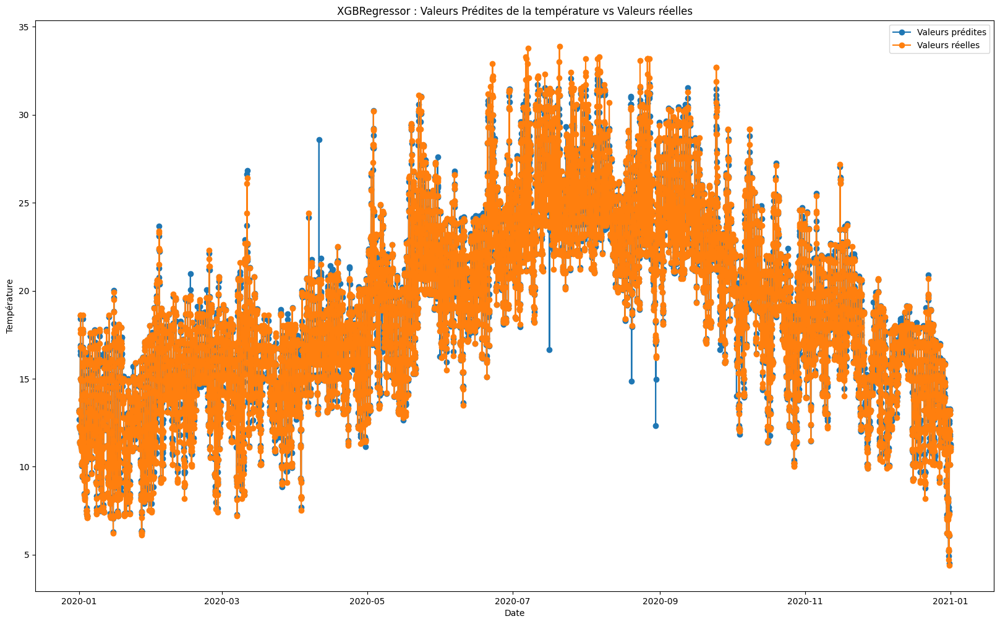

In [387]:
# Créer un graphe
plt.figure(figsize=(20, 12))


# Tracer les données de validation
plt.plot(val_data.index, xgb_predictions_val,  label='Valeurs prédites', marker='o')

# Tracer les données de validation
plt.plot(val_data.index, y_val, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('XGBRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

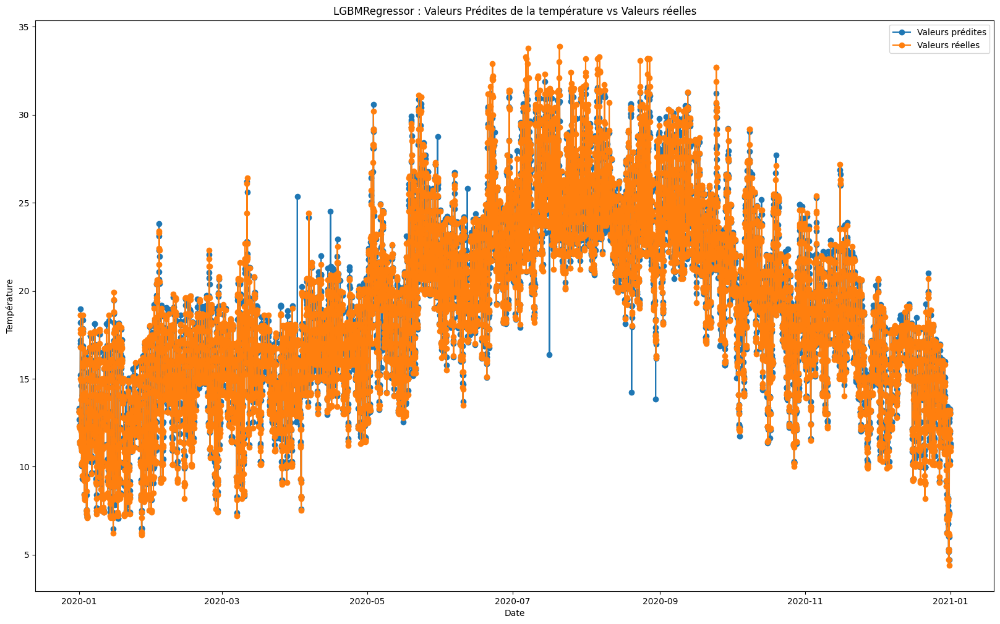

In [388]:
# Créer un graphe
plt.figure(figsize=(20, 12))


# Tracer les données de validation
plt.plot(val_data.index, lgbm_predictions_val,  label='Valeurs prédites', marker='o')

# Tracer les données de validation
plt.plot(val_data.index, y_val, label='Valeurs réelles', marker='o')

# Ajouter des étiquettes et un titre
plt.xlabel('Date')
plt.ylabel('Température')
plt.title('LGBMRegressor : Valeurs Prédites de la température vs Valeurs réelles')

# Ajouter une légende
plt.legend()

In [389]:
# Calculer les MSE pour chaque modèle
dt_mse_val = mean_squared_error(y_val, dt_predictions_val)
et_mse_val = mean_squared_error(y_val, et_predictions_val)
rf_mse_val = mean_squared_error(y_val, rf_predictions_val)
ada_mse_val = mean_squared_error(y_val, ada_predictions_val)
gb_mse_val = mean_squared_error(y_val, gb_predictions_val)
xgb_mse_val = mean_squared_error(y_val, xgb_predictions_val)
lgbm_mse_val = mean_squared_error(y_val, lgbm_predictions_val)

In [390]:
print("Comparaison des Modèles sur l'ensemble de validation - Mean Squared Error (MSE) ==> DecisionTreeRegressor : ", dt_mse_val, ' , ExtraTreeRegressor : ', et_mse_val, ' , RandomForestRegressor : ',rf_mse_val, ' , AdaBoostRegressor : ',ada_mse_val, ' , GradientBoostingRegressor : ',gb_mse_val, ' , XGBRegressor : ',xgb_mse_val, ' , LGBMRegressor : ',lgbm_mse_val)

Comparaison des Modèles sur l'ensemble de validation - Mean Squared Error (MSE) ==> DecisionTreeRegressor :  0.23074745337474076  , ExtraTreeRegressor :  0.23097254965151234  , RandomForestRegressor :  0.1635961156637923  , AdaBoostRegressor :  4.1610537859099015  , GradientBoostingRegressor :  0.3493118271105173  , XGBRegressor :  0.19100449802015682  , LGBMRegressor :  0.24272368408678924


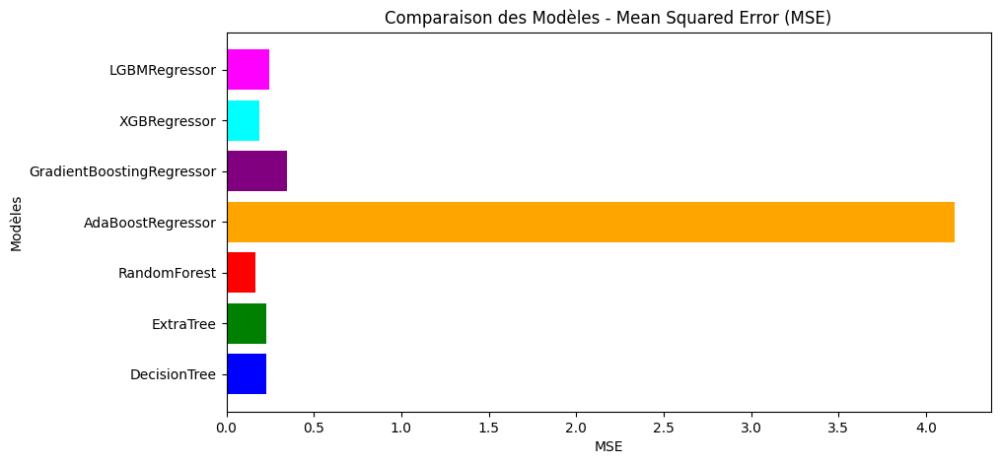

In [391]:
models = ['DecisionTree', 'ExtraTree', 'RandomForest', 'AdaBoostRegressor', 'GradientBoostingRegressor', 'XGBRegressor', 'LGBMRegressor']
mse_scores_val = [dt_mse_val, et_mse_val, rf_mse_val, ada_mse_val , gb_mse_val, xgb_mse_val, lgbm_mse_val]  # Remplacez ces valeurs par les résultats réels

# Choix des couleurs pour chaque modèle
colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan', 'magenta']

# Création du graphique
plt.figure(figsize=(10, 5))
plt.barh(models, mse_scores_val, color=colors)
plt.title('Comparaison des Modèles - Mean Squared Error (MSE)')
plt.xlabel('MSE')
plt.ylabel('Modèles')
plt.show()



Analysons les résultats de l'erreur quadratique moyenne (MSE) pour chaque modèle de régression sur l'ensemble de validation :

* **RandomForestRegressor : MSE = 0.1636**

  Le RandomForestRegressor affiche la plus faible erreur quadratique moyenne parmi tous les modèles évalués sur l'ensemble de validation. Cela suggère qu'il a la meilleure performance de prédiction en termes de précision sur cet ensemble de données.

* **XGBRegressor : MSE = 0.1910**

  Le XGBRegressor a une erreur quadratique moyenne légèrement plus élevée que le RandomForestRegressor, mais reste relativement basse, indiquant également une bonne performance de prédiction sur l'ensemble de validation.

* **LGBMRegressor : MSE = 0.2427**

  Le LGBMRegressor a une erreur quadratique moyenne légèrement plus élevée que le XGBRegressor, mais reste relativement basse, indiquant également une bonne performance de prédiction sur l'ensemble de validation.

* **GradientBoostingRegressor : MSE = 0.3493**

  Le GradientBoostingRegressor affiche une erreur quadratique moyenne plus élevée, ce qui suggère une performance de prédiction moins précise sur l'ensemble de validation par rapport aux modèles précédents.

* **DecisionTreeRegressor : MSE = 0.2307**

  Le DecisionTreeRegressor a une erreur quadratique moyenne légèrement plus élevée que le RandomForestRegressor, mais reste relativement basse, ce qui suggère également une bonne performance de prédiction sur l'ensemble de validation.

* **ExtraTreeRegressor : MSE = 0.2310**

  L'ExtraTreeRegressor a une erreur quadratique moyenne légèrement plus élevée que le DecisionTreeRegressor, mais reste relativement basse, ce qui suggère également une bonne performance de prédiction sur l'ensemble de validation.

* **AdaBoostRegressor : MSE = 4.1611**

  L'AdaBoostRegressor a de loin la plus grande erreur quadratique moyenne parmi tous les modèles évalués sur l'ensemble de validation, suggérant une performance de prédiction très peu précise sur cet ensemble de données.

▶▶ Sur la base de l'erreur quadratique moyenne sur l'ensemble de validation, le RandomForestRegressor semble être le modèle le plus performant, suivi du XGBRegressor et du LGBMRegressor. Les autres modèles montrent également des performances de prédiction relativement précises sur l'ensemble de validation, à l'exception de l'AdaBoostRegressor, qui a la performance la moins précise en raison de sa MSE très élevée.

In [392]:
# Calculer les MAE pour chaque modèle
dt_mae_val = mean_absolute_error(y_val, dt_predictions_val)
et_mae_val = mean_absolute_error(y_val, et_predictions_val)
rf_mae_val = mean_absolute_error(y_val, rf_predictions_val)
ada_mae_val = mean_absolute_error(y_val, ada_predictions_val)
gb_mae_val = mean_absolute_error(y_val, gb_predictions_val)
xgb_mae_val = mean_absolute_error(y_val, xgb_predictions_val)
lgbm_mae_val = mean_absolute_error(y_val, lgbm_predictions_val)

In [393]:
print("Comparaison des Modèles sur l'ensemble de validation - Mean Absolute Error (MAE) ==> DecisionTreeRegressor : ", dt_mae_val, ' , ExtraTreeRegressor : ', et_mae_val, ' , RandomForestRegressor : ',rf_mae_val, ' , AdaBoostRegressor : ',ada_mae_val, ' , GradientBoostingRegressor : ',gb_mae_val, ' , XGBRegressor : ',xgb_mae_val, ' , LGBMRegressor : ',lgbm_mae_val)

Comparaison des Modèles sur l'ensemble de validation - Mean Absolute Error (MAE) ==> DecisionTreeRegressor :  0.11678078898903012  , ExtraTreeRegressor :  0.12699882924059447  , RandomForestRegressor :  0.09679903900508756  , AdaBoostRegressor :  1.6085426323000582  , GradientBoostingRegressor :  0.3415970306824056  , XGBRegressor :  0.1633493671326038  , LGBMRegressor :  0.23693323516090004


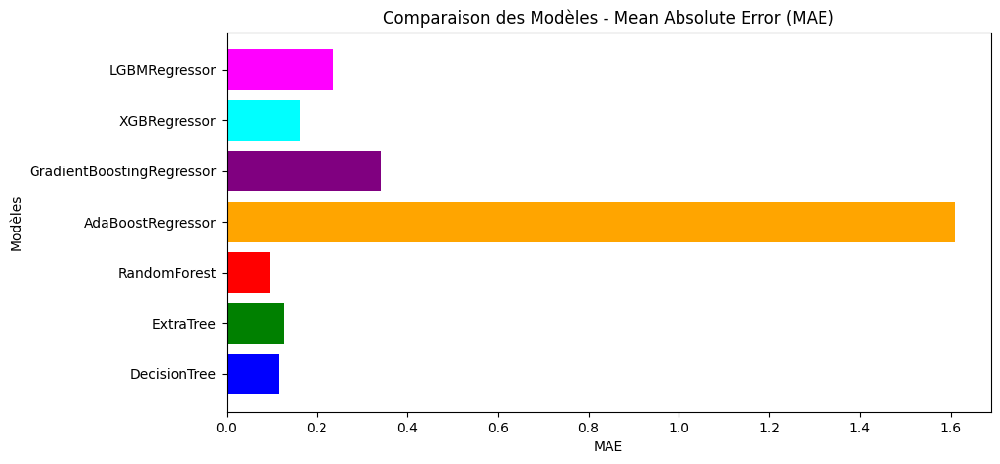

In [394]:
# Résultats fictifs à des fins d'exemple
models = ['DecisionTree', 'ExtraTree', 'RandomForest', 'AdaBoostRegressor', 'GradientBoostingRegressor', 'XGBRegressor', 'LGBMRegressor']
mae_scores_val = [dt_mae_val, et_mae_val, rf_mae_val, ada_mae_val , gb_mae_val, xgb_mae_val, lgbm_mae_val]  # Remplacez ces valeurs par les résultats réels

# Choix des couleurs pour chaque modèle
colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan', 'magenta']

# Création du graphique
plt.figure(figsize=(10, 5))
plt.barh(models, mae_scores_val, color=colors)
plt.title('Comparaison des Modèles - Mean Absolute Error (MAE)')
plt.xlabel('MAE')
plt.ylabel('Modèles')
plt.show()


Analysons les résultats de l'erreur absolue moyenne (MAE) pour chaque modèle de régression sur l'ensemble de validation :

* **RandomForestRegressor : MAE = 0.0968**

  Le RandomForestRegressor affiche la plus faible erreur absolue moyenne parmi tous les modèles évalués sur l'ensemble de validation. Cela suggère qu'il a la meilleure performance de prédiction en termes de précision sur cet ensemble de données.

* **XGBRegressor : MAE = 0.1633**

  Le XGBRegressor a une erreur absolue moyenne légèrement plus élevée que le RandomForestRegressor, mais reste relativement basse, indiquant également une bonne performance de prédiction sur l'ensemble de validation.

* **LGBMRegressor : MAE = 0.2369**

  Le LGBMRegressor a une erreur absolue moyenne légèrement plus élevée que le XGBRegressor, mais reste relativement basse, indiquant également une bonne performance de prédiction sur l'ensemble de validation.

* **GradientBoostingRegressor : MAE = 0.3416**

  Le GradientBoostingRegressor affiche une erreur absolue moyenne plus élevée, ce qui suggère une performance de prédiction moins précise sur l'ensemble de validation par rapport aux modèles précédents.

* **DecisionTreeRegressor : MAE = 0.1168**

  Le DecisionTreeRegressor a une erreur absolue moyenne légèrement plus élevée que le RandomForestRegressor, mais reste relativement basse, ce qui suggère également une bonne performance de prédiction sur l'ensemble de validation.

* **ExtraTreeRegressor : MAE = 0.1270**

  L'ExtraTreeRegressor a une erreur absolue moyenne légèrement plus élevée que le DecisionTreeRegressor, mais reste relativement basse, ce qui suggère également une bonne performance de prédiction sur l'ensemble de validation.


* **AdaBoostRegressor : MAE = 1.6085**

  L'AdaBoostRegressor a de loin la plus grande erreur absolue moyenne parmi tous les modèles évalués sur l'ensemble de validation, suggérant une performance de prédiction très peu précise sur cet ensemble de données.

▶▶ Sur la base de l'erreur absolue moyenne sur l'ensemble de validation, le RandomForestRegressor semble être le modèle le plus performant, suivi du XGBRegressor et du LGBMRegressor. Les autres modèles montrent également des performances de prédiction relativement précises sur l'ensemble de validation, à l'exception de l'AdaBoostRegressor, qui a la performance la moins précise en raison de son MAE très élevé.

In [395]:
# Calculer les R-squared pour chaque modèle
r2_dt_val = r2_score(y_val, dt_predictions_val)
r2_et_val = r2_score(y_val, et_predictions_val)
r2_rf_val = r2_score(y_val, rf_predictions_val)
r2_ada_val = r2_score(y_val, ada_predictions_val)
r2_gb_val = r2_score(y_val, gb_predictions_val)
r2_xgb_val = r2_score(y_val, xgb_predictions_val)
r2_lgbm_val = r2_score(y_val, lgbm_predictions_val)

In [396]:
print("Comparaison des Modèles sur l'ensemble de validation - R-squared ==> DecisionTreeRegressor : ", r2_dt_val, ' , ExtraTreeRegressor : ', r2_et_val, ' , RandomForestRegressor : ',r2_rf_val, ' , AdaBoostRegressor : ',r2_ada_val, ' , GradientBoostingRegressor : ',r2_gb_val, ' , XGBRegressor : ',r2_xgb_val, ' , LGBMRegressor : ',r2_lgbm_val)

Comparaison des Modèles sur l'ensemble de validation - R-squared ==> DecisionTreeRegressor :  0.9913655061461668  , ExtraTreeRegressor :  0.9913570831174837  , RandomForestRegressor :  0.9938782871292801  , AdaBoostRegressor :  0.844294735155497  , GradientBoostingRegressor :  0.9869288662555303  , XGBRegressor :  0.9928526744712057  , LGBMRegressor :  0.9909173595297561


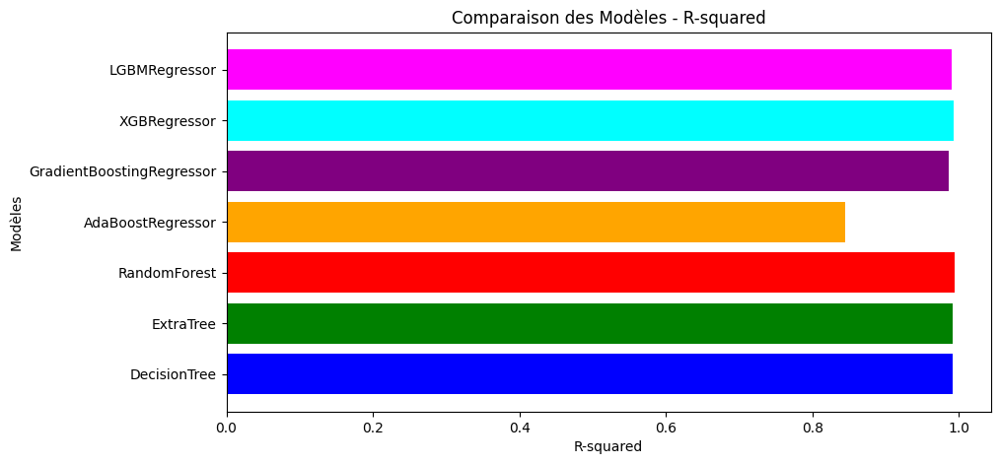

In [397]:
# Résultats fictifs à des fins d'exemple
models = ['DecisionTree', 'ExtraTree', 'RandomForest', 'AdaBoostRegressor', 'GradientBoostingRegressor', 'XGBRegressor', 'LGBMRegressor']
r2_scores_val = [r2_dt_val, r2_et_val, r2_rf_val, r2_ada_val , r2_gb_val, r2_xgb_val, r2_lgbm_val]  # Remplacez ces valeurs par les résultats réels

# Choix des couleurs pour chaque modèle
colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan', 'magenta']

# Création du graphique
plt.figure(figsize=(10, 5))
plt.barh(models, r2_scores_val, color=colors)
plt.title('Comparaison des Modèles - R-squared')
plt.xlabel('R-squared')
plt.ylabel('Modèles')
plt.show()

Analysons les résultats du coefficient de détermination (R-squared) pour chaque modèle de régression sur l'ensemble de validation :

* **RandomForestRegressor : R-squared = 0.9939**

  Le RandomForestRegressor affiche le plus haut coefficient de détermination parmi tous les modèles évalués sur l'ensemble de validation. Cela suggère que ce modèle explique très bien la variance des données et offre un ajustement exceptionnellement bon aux données de validation.

* **XGBRegressor : R-squared = 0.9929**

  Le XGBRegressor a un coefficient de détermination légèrement inférieur au RandomForestRegressor, mais reste très élevé, indiquant également un ajustement précis aux données de validation avec une explication importante de la variance.

* **ExtraTreeRegressor : R-squared = 0.9914**

  L'ExtraTreeRegressor a un coefficient de détermination légèrement inférieur au XGBRegressor mais reste très élevé, indiquant également un ajustement précis aux données de validation avec une explication importante de la variance.

* **LGBMRegressor : R-squared = 0.9909**

  Le LGBMRegressor a un coefficient de détermination légèrement inférieur à celui du XGBRegressor mais reste très élevé, indiquant également un ajustement précis aux données de validation avec une explication importante de la variance.

* **DecisionTreeRegressor : R-squared = 0.9914**

  Le DecisionTreeRegressor a un coefficient de détermination légèrement inférieur à celui du RandomForestRegressor mais reste très élevé, indiquant également un ajustement précis aux données de validation avec une explication importante de la variance.

* **GradientBoostingRegressor : R-squared = 0.9869**

  Le GradientBoostingRegressor affiche un coefficient de détermination légèrement inférieur aux autres modèles, mais reste très élevé, indiquant également un ajustement précis aux données de validation avec une explication importante de la variance.

* **AdaBoostRegressor : R-squared = 0.8443**

  L'AdaBoostRegressor a le plus bas coefficient de détermination parmi tous les modèles évalués, bien qu'il reste relativement élevé. Cela suggère que ce modèle explique moins bien la variance des données par rapport aux autres modèles examinés.

▶▶ Sur la base du coefficient de détermination sur l'ensemble de validation, le RandomForestRegressor semble être le modèle le plus performant, suivi de près par le XGBRegressor et l'ExtraTreeRegressor. Les autres modèles montrent également des performances élevées en termes d'ajustement aux données de validation, à l'exception de l'AdaBoostRegressor, qui a la performance la moins précise en raison de son R-squared plus faible.

# **Analyse Global**
En examinant les performances des différents modèles de régression sur les ensembles de données d'entraînement, de validation et de test, nous pouvons tirer plusieurs conclusions globales :

* **Performance générale des modèles :**

  * Les modèles RandomForestRegressor, XGBRegressor et LGBMRegressor se distinguent généralement par leurs performances élevées sur tous les ensembles de données, avec des scores relativement bas en termes d'erreur absolue moyenne (MAE), d'erreur quadratique moyenne (MSE) et de coefficient de détermination (R-squared).
  * Les modèles DecisionTreeRegressor et ExtraTreeRegressor affichent également de bonnes performances, bien qu'ils aient tendance à avoir des scores légèrement inférieurs aux modèles précédents.

* **Variabilité des performances :**

  * Les performances des modèles varient selon les ensembles de données. Par exemple, l'AdaBoostRegressor montre des performances relativement faibles sur tous les ensembles de données, avec des scores MAE et MSE élevés et un R-squared relativement bas.
  * Le GradientBoostingRegressor présente des performances solides sur l'ensemble de test, mais montre des performances légèrement inférieures sur l'ensemble de validation par rapport aux autres modèles.

* **Robustesse des modèles :**

  * Les modèles RandomForestRegressor, XGBRegressor et LGBMRegressor semblent être les plus robustes, affichant des performances cohérentes sur tous les ensembles de données.
  * Certains modèles, comme l'AdaBoostRegressor, semblent moins robustes et peuvent présenter des performances variables selon l'ensemble de données.

* **Choix du modèle :**

  Sur la base des critères de précision et d'ajustement aux données, le RandomForestRegressor semble être le choix préféré, suivi de près par le XGBRegressor et le LGBMRegressor.